In [28]:
import warnings
import numpy as np
import pandas as pd
from math import floor, ceil
import os.path as op
from typing import List, Any, Callable, Literal, Optional, Union
from pandas.api.types import is_object_dtype
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from matplotlib.patches import FancyArrowPatch
import matplotlib.lines as mlines
from scipy.stats import gaussian_kde, norm, f_oneway
from scipy.signal import savgol_filter
from scipy.stats import mannwhitneyu
from peregrin.scripts import PlotParams
import seaborn as sns
from itertools import combinations
import altair as alt
import plotly.graph_objects as go
from datetime import date
from superviolin.plot import Superviolin
from scipy.stats import ttest_ind, ttest_rel
import io
from pathlib import Path
from typing import Literal
from matplotlib.collections import LineCollection
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from PIL import Image
import imageio.v3 as iio



def _pick_encoding(path, encodings=("utf-8", "cp1252", "latin1", "iso8859_15")):
    for enc in encodings:
        try:
            return pd.read_csv(path, encoding=enc, low_memory=False if enc != "utf-8" else True)
        except UnicodeDecodeError:
            continue

def _has_strings(s: pd.Series) -> bool:
    # pandas "string" dtype (pyarrow/python)
    if isinstance(s.dtype, pd.StringDtype):
        return s.notna().any()
    # categorical of strings?
    if isinstance(s.dtype, pd.CategoricalDtype):
        return isinstance(s.dtype.categories.dtype, pd.StringDtype) and s.notna().any()
    # numeric, datetime, bool, etc.
    if not is_object_dtype(s.dtype):
        return False
    # Fallback for object-dtype (mixed types): minimal Python loop over NumPy array
    arr = s.to_numpy(dtype=object, copy=False)
    return any(isinstance(v, (str, np.str_)) for v in arr)

def GetCmap(c_mode: str) -> mcolors.Colormap:
        """
        Get a colormap according to the selected color mode.

        """

        if c_mode == 'greyscale LUT':
            return plt.cm.gist_gray
        elif c_mode == 'reverse grayscale LUT':
            return plt.cm.gist_yarg
        elif c_mode == 'jet LUT':
            return plt.cm.jet
        elif c_mode == 'brg LUT':
            return plt.cm.brg
        elif c_mode == 'cool LUT':
            return plt.cm.cool
        elif c_mode == 'hot LUT':
            return plt.cm.hot
        elif c_mode == 'inferno LUT':
            return plt.cm.inferno
        elif c_mode == 'plasma LUT':
            return plt.cm.plasma
        elif c_mode == 'CMR-map LUT':
            return plt.cm.CMRmap
        elif c_mode == 'gist-stern LUT':
            return plt.cm.gist_stern
        elif c_mode == 'gnuplot LUT':
            return plt.cm.gnuplot
        elif c_mode == 'viridis LUT':
            return plt.cm.viridis
        elif c_mode == 'cividis LUT':
            return plt.cm.cividis
        elif c_mode == 'rainbow LUT':
            return plt.cm.rainbow
        elif c_mode == 'turbo LUT':
            return plt.cm.turbo
        elif c_mode == 'nipy-spectral LUT':
            return plt.cm.nipy_spectral
        elif c_mode == 'gist-ncar LUT':
            return plt.cm.gist_ncar
        elif c_mode == 'twilight LUT':
            return plt.cm.twilight
        elif c_mode == 'seismic LUT':
            return plt.cm.seismic
        else:
            return None

def MakeCmap(elements: list, cmap: str) -> list:
    """
    Generates a qualitative colormap for a given list of elements.
    """

    n = len(elements)   # Number of elements in the dictionary
    if n == 0:          # Return an empty list if there are no elements
        return []       
    
    cmap = plt.get_cmap(cmap)                                   # Get the colormap
    colors = [mcolors.to_hex(cmap(i / n)) for i in range(n)]    # Generate a color for each element

    return colors

def GenerateRandomColor() -> str:
        """
        Generate a random color in hexadecimal format.
        """

        r = np.random.randint(0, 255)   # Red LED intensity
        g = np.random.randint(0, 255)   # Green LED intensity
        b = np.random.randint(0, 255)   # Blue LED intensity

        return '#{:02x}{:02x}{:02x}'.format(r, g, b)


def BuildRepPalette(df: pd.DataFrame, tag: str = 'Replicate') -> dict:

    print(df[f'{tag} color'].head())
    tags = df[tag].unique().tolist()
    mp = {}
    if f'{tag} color' in df.columns:
        mp = (df[[tag, f'{tag} color']]
                .dropna()
                .drop_duplicates(tag)
        )
        mp = mp.set_index(tag)[f'{tag} color'].to_dict()
    print(mp)
    missing = [t for t in tags if t not in mp]
    if missing:
        print(f'Generating colors for {len(missing)} missing {tag}s...')
        return
        # TODO: add notice parser


    return mp


In [29]:
TRACKS_DATAFRAME = pd.read_csv(r"C:\Users\modri\Desktop\Lab\Peregrin project\Data\Track stats 2025-09-30 1.csv")
TRACKS_DATAFRAME['Track UID'] = np.arange(len(TRACKS_DATAFRAME))  # starts at 0
TRACKS_DATAFRAME.set_index('Track UID', drop=False, inplace=True, verify_integrity=True)

# print(TRACKS_DATAFRAME.columns)

# display(TRACKS_DATAFRAME)

In [30]:
SPOTS_DATAFRAME = pd.read_csv(r"C:\Users\modri\Desktop\Lab\Peregrin project\Data\Spot stats 2025-09-30-1.csv")
# print(SPOTS_DATAFRAME.columns)
# grp = SPOTS_DATAFRAME.groupby(['Condition', 'Replicate', 'Track ID'], sort=False)

# # ---- Add unique per-track index (1-based) ----
# SPOTS_DATAFRAME['Track UID'] = grp.ngroup()
SPOTS_DATAFRAME.set_index(['Track UID'], drop=False, append=False, inplace=True, verify_integrity=False)

# print(SPOTS_DATAFRAME.columns)


In [31]:
FRAMES_DATAFRAME = pd.read_csv(r"C:\Users\modri\Desktop\Lab\Peregrin project\Data\Frame stats 2025-10-25 1.csv")
didudidu = SPOTS_DATAFRAME.copy()

FRAMES_DATAFRAME.sort_values(by='Replicate', inplace=True)
didudidu.sort_values(by='Replicate', inplace=True)
fifufifu = FRAMES_DATAFRAME.copy()

didudidu.set_index('Replicate', drop=False, inplace=True, verify_integrity=False)
fifufifu.set_index('Replicate', drop=False, inplace=True, verify_integrity=False)


In [32]:
# longer: df_long (has 'replicate' index and column 'replicate_color')
# shorter: df_short (has matching replicate index)

# Align by replicate label instead of raw values length
rep_color_map = (
	didudidu[['Replicate', 'Replicate color']]
	.drop_duplicates('Replicate')
	.set_index('Replicate')['Replicate color']
)
fifufifu['Replicate color'] = fifufifu.index.map(rep_color_map)

display(fifufifu)

,Condition,Replicate,Time point,Frame,Track length min,Track length max,Track length mean,Track length std,Track length median,Track displacement min,...,Speed mean,Speed std,Speed median,Direction mean (rad),Direction std (rad),Direction median (rad),Direction mean (deg),Direction std (deg),Direction median (deg),Replicate color
Replicate,,,,,,,,,,,,,,,,,,,,,
BC39,memory-ctr,BC39,0.0,1,0.197431,22.152852,8.625006,5.383004,8.467348,0.000000,...,8.625006,5.383004,8.467348,0.000000,1.000000,0.000000,0.000000,57.295780,0.000000,#ff7e47
BC39,naive-ctr,BC39,240.0,2,24.400325,24.400325,24.400325,NaN,24.400325,12.581150,...,11.819175,NaN,11.819175,-0.897157,1.000000,-0.897157,308.596668,57.295780,308.596668,#ff7e47
BC39,naive-ctr,BC39,240.0,1,6.672129,17.292770,13.139717,5.676029,15.454250,0.000000,...,13.139717,5.676029,15.454250,0.000000,1.000000,0.000000,0.000000,57.295780,0.000000,#ff7e47
BC39,naive-ctr,BC39,180.0,4,1.821324,72.209269,22.067360,21.129854,12.828705,0.075678,...,5.232375,5.409509,2.944059,-0.556995,0.112922,-0.587938,328.086514,6.469942,326.313623,#ff7e47
BC39,naive-ctr,BC39,180.0,3,30.623250,45.847621,38.929575,6.259834,39.022268,19.186105,...,12.484974,2.642866,12.904466,2.961472,0.153992,3.095005,169.679841,8.823116,177.330735,#ff7e47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BC43,naive-ctr,BC43,3360.0,10,46.057589,76.757887,57.070838,17.089564,48.397037,17.847921,...,1.562993,1.215495,1.764765,-1.848622,0.141316,-0.932644,254.081739,8.096836,306.563436,#fed401
BC43,naive-ctr,BC43,3360.0,11,27.394078,108.888214,68.141146,57.625056,68.141146,24.209986,...,4.238742,5.851118,4.238742,0.813492,0.588737,0.813492,46.609677,33.732130,46.609677,#fed401
BC43,naive-ctr,BC43,3360.0,12,37.694337,37.694337,37.694337,NaN,37.694337,36.895701,...,0.036470,NaN,0.036470,-1.748683,1.000000,-1.748683,259.807832,57.295780,259.807832,#fed401


In [33]:
FRAMES_DATAFRAME['Replicate color'] = FRAMES_DATAFRAME['Replicate'].map(rep_color_map)

In [34]:
display(FRAMES_DATAFRAME.columns)

Index(['Condition', 'Replicate', 'Time point', 'Frame', 'Track length min',
       'Track length max', 'Track length mean', 'Track length std',
       'Track length median', 'Track displacement min',
       'Track displacement max', 'Track displacement mean',
       'Track displacement std', 'Track displacement median',
       'Confinement ratio min', 'Confinement ratio max',
       'Confinement ratio mean', 'Confinement ratio std',
       'Confinement ratio median', 'Speed min', 'Speed max', 'Speed mean',
       'Speed std', 'Speed median', 'Direction mean (rad)',
       'Direction std (rad)', 'Direction median (rad)', 'Direction mean (deg)',
       'Direction std (deg)', 'Direction median (deg)', 'Replicate color'],
      dtype='object')

In [35]:
_list = ["a", "b", "c"]

print(*_list)

a b c


In [36]:
BuildRepPalette(FRAMES_DATAFRAME, 'Replicate')

0        #ff7e47
21902    #ff7e47
21901    #ff7e47
21900    #ff7e47
21899    #ff7e47
Name: Replicate color, dtype: object
{'BC39': '#ff7e47', 'BC42': '#e38963', 'BC42 (fresh)': '#9d5353', 'BC43': '#fed401'}


{'BC39': '#ff7e47',
 'BC42': '#e38963',
 'BC42 (fresh)': '#9d5353',
 'BC43': '#fed401'}

In [49]:
from pathlib import Path
import pandas as pd
import altair as alt


def altair_line_chart(
    df: pd.DataFrame, 
    param: str, 
    *args,
    condition: str = 'all', 
    replicate: str = 'all-grouped', 
    cmap: str = 'Set1', 
    use_custom_palette: bool = False,
    interpolation: str = None,
    summary_stats: list[str] = ['mean', 'median'],
    time_units: str = 's',
    units: str = '',
    title: str = ''
):
    if interpolation == 'None':
        interpolation = None

    df = df.copy()
    df = df.sort_values('Time point')

    if condition == 'all':
        element = 'Condition'
        shorthand = 'Condition:N'
        dfa = df.groupby(['Condition', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()
    else:
        if replicate == 'all-grouped':
            element = 'Condition'
            shorthand = 'Condition:N'
            dfa = df.loc[df['Condition'] == condition]
        elif replicate == 'all-separately':
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[df['Condition'] == condition].groupby(['Replicate', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()
        else:
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[(df['Condition'] == condition) & (df['Replicate'] == replicate)].groupby(['Replicate', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()

    elements = df[element].unique()

    # Colors
    try:
        if use_custom_palette:
            colors = BuildRepPalette(df, element)
            colors = [colors[e] for e in elements]
        else:
            colors = MakeCmap(elements, cmap)
    except Exception:
        colors = [GenerateRandomColor() for _ in elements]

    color_scale = alt.Scale(domain=elements, range=colors)

    # One shared dash scale and legend for descriptives
    stroke_patterns = {'mean': [0], 'median': [5], 'min': [1], 'max': [2]}
    dash_range = [stroke_patterns[s] for s in summary_stats]
    dash_scale = alt.Scale(domain=summary_stats, range=dash_range)
    dash_legend = alt.Legend(
        title='Statistic',
        symbolType='stroke',
        symbolStrokeWidth=5,
        symbolStrokeColor=colors[0],
        symbolOpacity=1,
        symbolSize=300,
        titleFontSize=14,
        labelFontSize=13,
    )


    nearest = alt.selection_point(nearest=True, on="pointerover", fields=['Time point'], empty=False)

    layers = []
    opacity = {'mean': 1, 'median': 0.7, 'min': 0.4, 'max': 0.4}

    for s in summary_stats:

        mark_args = {
            **{"strokeDash": stroke_patterns[s], "strokeWidth": 3},
            **({"interpolate": interpolation} if interpolation else {})
        }

        # add a constant field "stat" = s so the legend can show dash entries
        base = (
            alt.Chart(dfa)
            .transform_calculate(Statistic=f'"{s}"')
            .encode(
                x=alt.X(
                    'Time point:Q', 
                    title=f'Time point [{time_units}]',
                    axis=alt.Axis(titleFontSize=16)
                ),
                y=alt.Y(
                    f'{param} {s}:Q', 
                    title=f'{param} [{units}]',
                    axis=alt.Axis(titleFontSize=16)
                ),
                color=alt.Color(
                    shorthand, 
                    title=element, 
                    scale=color_scale, 
                    legend=alt.Legend(
                        symbolStrokeWidth=10,
                        symbolOpacity=0.8,
                        titleFontSize=14,
                        labelFontSize=13
                    )
                ),
                # dash encoding drives the statistic legend
                strokeDash=alt.StrokeDash(
                    'Statistic:N',
                    scale=dash_scale,
                    legend=dash_legend,
                ),
            )
        )

        
        line = base.mark_line(**mark_args).encode(
            opacity=alt.value(opacity[s])
        )

        selectors = base.mark_point().encode(opacity=alt.value(0)).add_params(nearest)

        when_near = alt.when(nearest)

        hover_scatter = base.mark_point().encode(
            opacity=when_near.then(alt.value(1)).otherwise(alt.value(0))
        )

        hover_text = base.mark_text(align="left", dx=6, dy=0, fontSize=14).encode(
            color=alt.value('black'),
            text=when_near.then(f'{param} {s}:Q').otherwise(alt.value(""))
        )

        rule = alt.Chart(dfa).mark_rule(color="gray").encode(x='Time point:Q').transform_filter(nearest)

        layers.extend([line, selectors, hover_scatter, hover_text, rule])

    chart = alt.layer(*layers).properties(
        width=1200, height=500, title=title
    ).configure_title(
        fontSize=20,
    ).configure_view(
        strokeWidth=1
    ).interactive()

    return chart

interpolations = ['basis', 'basis-open', 'basis-closed', 'bundle', 'cardinal', 'cardinal-open', 'cardinal-closed', 'catmull-rom', 'linear', 'linear-closed', 'monotone', 'natural', 'step', 'step-before', 'step-after']

altair_line_chart(FRAMES_DATAFRAME, "Speed", condition=FRAMES_DATAFRAME['Condition'].unique()[3], replicate="all-separately", use_custom_palette=True, cmap="Set1", interpolation=None, summary_stats=["mean", "median"], time_units="s", units='µm/min', title="Speed across time for all conditions")


0        #ff7e47
21891    #ff7e47
32695    #fed401
37184    #9d5353
16849    #ff7e47
Name: Replicate color, dtype: object
{'BC39': '#ff7e47', 'BC43': '#fed401', 'BC42 (fresh)': '#9d5353', 'BC42': '#e38963'}


alt.LayerChart(...)

In [ ]:
def altair_band_chart(
        df: pd.DataFrame, 
        param: str, 
        *args,
        condition: str = 'all', 
        replicate: str = 'all-grouped', 
        cmap: str = 'Set1', 
        use_custom_palette: bool = False,
        interpolation: str = None,
        summary_stats: list[str] = ['mean', 'median'],
        time_units: str = 's',
        units: str = '',
        title: str = '',
        extent=extent_[1], 
    ):

    if interpolation == 'None':
        interpolation = None

    df = df.copy()
    df = df.sort_values('Time point')

    if condition == 'all':
        element = 'Condition'
        shorthand = 'Condition:N'
        dfa = df.groupby(['Condition', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()
    else:
        if replicate == 'all-grouped':
            element = 'Condition'
            shorthand = 'Condition:N'
            dfa = df.loc[df['Condition'] == condition]
        elif replicate == 'all-separately':
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[df['Condition'] == condition].groupby(['Replicate', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()
        else:
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[(df['Condition'] == condition) & (df['Replicate'] == replicate)].groupby(['Replicate', 'Time point']).agg({f'{param} {s}': (s) for s in summary_stats}).reset_index()

    elements = df[element].unique()

    # Colors
    try:
        if use_custom_palette:
            colors = BuildRepPalette(df, element)
            colors = [colors[e] for e in elements]
        else:
            colors = MakeCmap(elements, cmap)
    except Exception:
        colors = [GenerateRandomColor() for _ in elements]

    color_scale = alt.Scale(domain=elements, range=colors)
    

    df['lower'] = df[metric_mean] - df[metric_std]
    df['upper'] = df[metric_mean] + df[metric_std]

    # Retrieve unique conditions and assign colors from the selected qualitative colormap.
    elements = df[element].unique().tolist()
    colors = get_q_cmap_list(elements, cmap)
    color_scale=alt.Scale(domain=elements, range=colors)
    
    if extent == 'min-max':
        band = alt.Chart(df).encode(
            x=alt.X('POSITION_T', title='Time position'),
            y=alt.Y(metric_min),
            y2=alt.Y2(metric_max),
            color=alt.Color(shorthand, title=element_, scale=color_scale),
            tooltip=alt.value(None)
            )
        if interpolation is not None:
            band = band.mark_errorband(interpolate=interpolation)
        else:
            band = band.mark_errorband()

    elif extent == 'orig_std':
        band = alt.Chart(df).encode(
            x=alt.X('POSITION_T', title='Time position'),
            y=alt.Y('upper'),
            y2=alt.Y2('lower'),
            color=alt.Color(shorthand, title=element_, scale=color_scale),   
            opacity=alt.value(0.25),
            tooltip=alt.value(None)
        )
        if interpolation is not None:
            band = band.mark_errorband(interpolate=interpolation)
        else:
            band = band.mark_errorband()

    else:
        band = alt.Chart(df).mark_errorband(extent=extent).encode(
            x=alt.X('POSITION_T', title='Time position'),
            y=alt.Y('upper'),
            y2=alt.Y2('lower'),
            color=alt.Color(shorthand, title=element_, scale=color_scale),
            opacity=alt.value(0.25),
            tooltip=alt.value(None)
        )
        if interpolation is not None:
            band = band.mark_errorband(interpolate=interpolation)  
        else:
            band = band.mark_errorband()

    mean_base = alt.Chart(df).encode(
        x=alt.X('POSITION_T', title='Time position'),
        y=alt.Y(metric_mean, title=None),
        color=alt.Color(shorthand, title=element_, scale=color_scale),
        opacity=alt.value(mean_opacity),
        strokeWidth=alt.value(3),
        tooltip=alt.value(None)
        )

    if interpolation is not None:
        mean_line = mean_base.mark_line(interpolate=interpolation)
    else:
        mean_line = mean_base.mark_line()

    nearest = alt.selection_point(nearest=True, on="pointerover",
                              fields=['POSITION_T'], empty=False)    
    
    color_scale = alt.Scale(domain=elements, range=colors)

    # Transparent selectors across the chart. This is what tells us
    mean_selectors = mean_base.mark_point().encode(
        opacity=alt.value(0),
        ).add_params(
        nearest
        )
    
    when_near = alt.when(nearest)

    mean_points = mean_base.mark_point().encode(
        opacity=when_near.then(alt.value(1)).otherwise(alt.value(0)),
        )    

    # Draw a rule at the location of the selection
    rules = alt.Chart(df).mark_rule(color="gray").encode(
        x='POSITION_T',
        ).transform_filter(
        nearest
        )

    # Calculate separate fields for each line of the tooltip.
    tooltip_data = alt.Chart(df).transform_calculate(
        tooltip_line1=f'"{element_}: " + datum.CONDITION',
        tooltip_line2=f'"Time point: " + datum.POSITION_T',
        tooltip_line3=f'"Mean: " + datum["{metric_mean}"]',
        tooltip_line4=f'"Std: " + datum["{metric_std}"]',
        tooltip_line5=f'"Min: " + datum["{metric_min}"]',
        tooltip_line6=f'"Max: " + datum["{metric_max}"]',
        )
    
    if condition == 'all':
        text_opacity = 0
    else:
        text_opacity = 1

    l = -75

    # Create text marks for each line.
    tooltip_line1_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=-30-l,  # adjust vertical offset as needed
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line1:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)

    tooltip_line2_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=-15-l,  # adjust vertical offset for the second line
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line2:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)

    tooltip_line3_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=0-l,  # adjust vertical offset for the third line
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line3:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)
    
    tooltip_line4_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=15-l,  # adjust vertical offset for the fourth line
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line4:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)
    
    tooltip_line5_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=30-l,  # adjust vertical offset for the fifth line
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line5:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)
    
    tooltip_line6_mark = tooltip_data.mark_text(
        align='left',
        dx=6,
        dy=45-l,  # adjust vertical offset for the sixth line
        fontSize=12,
        fontWeight='bold'
        ).encode(
        x='POSITION_T',
        text=alt.condition(nearest, 'tooltip_line6:N', alt.value('')),
        opacity=alt.value(text_opacity)
        ).transform_filter(nearest)

    # Layer the tooltip text marks with your other layers.
    chart = alt.layer(
        band, mean_line, mean_points, mean_selectors, rules,
        tooltip_line1_mark, tooltip_line2_mark, tooltip_line3_mark, tooltip_line4_mark, tooltip_line5_mark, tooltip_line6_mark
        ).properties(
        width=1200,
        height=300,
        title=f'{Metric} with its standard deviation across time {what}'
        ).interactive()

    # chart.save('cache_/errorband_chart.pdf')
    chart.save('cache_/errorband_chart.html')
    chart.save('cache_/errorband_chart.svg')

    return chart

chart = altair_band_chart(Time_stats, 'MEAN_SPEED', dict_Time_metrics['MEAN_SPEED'], condition=1, replicates_separately=True, cmap=cmaps[3], interpolation=interpolations_[1], show_mean=True, extent='orig_std')
display(chart)

In [98]:
from pathlib import Path
import pandas as pd
import altair as alt


def altair_line_chart(
    df: pd.DataFrame, 
    param: str, 
    *args,
    condition: str = 'all', 
    replicate: str = 'all-grouped', 
    cmap: str = 'Set1', 
    use_custom_palette: bool = False,
    interpolation: str = None,
    descriptives: list[str] = ['mean', 'median'],
    time_units: str = 's',
    title: str = ''
):
    # keep original args; do NOT overwrite them

    if interpolation == 'None':
        interpolation = None

    df = df.copy()
    df = df.sort_values('Time point')

    # Branching: choose element and aggregate when needed
    # descriptives = ['mean', 'median', 'min', 'max']

    if condition == 'all':
        element = 'Condition'
        shorthand = 'Condition:N'
        dfa = df.groupby(['Condition', 'Time point']).agg({f'{param} {d}': (d) for d in descriptives}).reset_index()
    else:
        if replicate == 'all-grouped':
            element = 'Condition'
            shorthand = 'Condition:N'
            dfa = df.loc[df['Condition'] == condition]
        elif replicate == 'all-separately':
            # no aggregation; plot each replicate series
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[df['Condition'] == condition].groupby(['Replicate', 'Time point']).agg({f'{param} {d}': (d) for d in descriptives}).reset_index()
        else:
            # specific replicate
            element = 'Replicate'
            shorthand = 'Replicate:N'
            dfa = df.loc[(df['Condition'] == condition) & (df['Replicate'] == replicate)].sort_values(by=['Condition', 'Replicate', 'Time point'])

    # Get elements list
    elements = df[element].unique()

    print(elements)

    # Colors
    if use_custom_palette:
        try:
            colors = BuildRepPalette(df, element)
            colors = [colors[e] for e in elements]
            print(colors)
        except Exception:
            try:
                colors = MakeCmap(elements, cmap)
            except Exception:
                colors = [GenerateRandomColor() for _ in elements]
    else:
        try:
            colors = MakeCmap(elements, cmap)
        except Exception:
            colors = [GenerateRandomColor() for _ in elements]


    color_scale = alt.Scale(domain=elements, range=colors)


    # Hover selection
    nearest = alt.selection_point(nearest=True, on="pointerover", fields=['Time point'], empty=False)

    layers = []
    line_legend = []

    opacity = {'mean': 1, 'median': 0.7, 'min': 0.4, 'max': 0.4}
    stroke = {'mean': [1, 1], 'median': [4, 3], 'min': [1, 1], 'max': [1, 1]}

    for d in descriptives:

        base = alt.Chart(dfa).encode(
            x=alt.X(
                'Time point', 
                title=f'Time point {time_units}' if layers == [] else None,
                axis=alt.Axis(titleFontSize=16)
                ),
            y=alt.Y(
                f'{param} {d}', 
                title=f'{param} {d}' if len(descriptives) == 1 else None,
                axis=alt.Axis(titleFontSize=16)
                ),
            color=alt.Color(
                shorthand, 
                title=element, 
                scale=color_scale, 
                legend=alt.Legend(
                    symbolStrokeWidth=10,
                    symbolOpacity=0.8,
                    titleFontSize=14,
                    labelFontSize=12,    
                )
            ),
        )

        if interpolation:
            line = base.mark_line(interpolate=interpolation, strokeDash=stroke[d]).encode(
                opacity=alt.value(opacity[d])
            )
        else:
            line = base.mark_line(strokeDash=stroke[d], strokeWidth=3).encode(
                opacity=alt.value(opacity[d]),
                
            )

        selectors = base.mark_point().encode(
            opacity=alt.value(0),
            ).add_params(
            nearest
            )

        when_near = alt.when(nearest)

        hover_scatter = base.mark_point().encode(
            opacity=when_near.then(alt.value(1)).otherwise(alt.value(0))
        )

        hover_text = line.mark_text(align="left", dx=6, dy=0, fontSize=14).encode(
            color=alt.value('black'),
            text=when_near.then(f'{param} {d}').otherwise(alt.value(""))
        )

        rule = alt.Chart(dfa).mark_rule(color="gray").encode(x='Time point').transform_filter(nearest)

        layers.extend([line, selectors, hover_scatter, hover_text, rule])

    # layers.append(rule)

    chart = alt.layer(*layers).properties(
        width=1200, height=500, title=title
    ).configure_title(
        fontSize=20,
    ).configure_view(
        strokeWidth=1
    ).interactive()


    # Safe saves
    # outdir = Path('cache_')
    # outdir.mkdir(parents=True, exist_ok=True)
    # chart.save(outdir / 'line_chart.html')
    # chart.save(outdir / 'line_chart.svg')

    return chart

interpolations = ['basis', 'basis-open', 'basis-closed', 'bundle', 'cardinal', 'cardinal-open', 'cardinal-closed', 'catmull-rom', 'linear', 'linear-closed', 'monotone', 'natural', 'step', 'step-before', 'step-after']

altair_line_chart(FRAMES_DATAFRAME, "Speed", condition=FRAMES_DATAFRAME['Condition'].unique()[0], replicate="all-separately", use_custom_palette=True, cmap="Set1", interpolation=None, descriptives=["mean", "median"], time_units="s", title="Speed across time for all conditions")
# display(chart)

['BC39' 'BC43' 'BC42 (fresh)' 'BC42']
0        #ff7e47
21891    #ff7e47
32695    #fed401
37184    #9d5353
16849    #ff7e47
Name: Replicate color, dtype: object
{'BC39': '#ff7e47', 'BC43': '#fed401', 'BC42 (fresh)': '#9d5353', 'BC42': '#e38963'}
['#ff7e47', '#fed401', '#9d5353', '#e38963']


alt.LayerChart(...)

In [ ]:
def altair_line_chart(
        df: pd.DataFrame, 
        metric: str, 
        *args,
        condition: str = 'all', 
        replicate: str = 'all-grouped', 
        cmap: str = 'Set1', 
        use_custom_palette: bool = False,
        interpolation: str = None,
        descriptives: list[str] = ['mean', 'median'],
        time_units: str = 's',
        title: str = ''

    ):

    condition = [
        'all',
        *df['Condition'].unique().tolist()
    ]

    replicate = [
        'all-grouped',
        'all-separately',
        *df['Replicate'].unique().tolist()
    ]

    if interpolation == 'None': interpolation = None

    df = df.copy()
    df.sort_values('Time point')

    if condition == 'all':
        df = df.groupby(['Condition','Time point']).agg({metric: 'mean', metric: 'median', metric: 'min', metric: 'max'}).reset_index()
        shorthand = 'Condition:N'
        element = 'Condition'
    if condition != 'all': 
        if replicate == 'all-grouped':
            df = df[df['Condition'] == condition].groupby(['Condition', 'Time point']).agg({metric: 'mean', metric: 'median', metric: 'min', metric: 'max'}).reset_index()
            shorthand = 'Condition:N'
            element = 'Condition'
        elif replicate == 'all-separately':
            df = df[df['Condition'] == condition]
            shorthand = 'Replicate:N'
            element = 'Replicate'
        # else:
        #     df = df[(df['Condition'] == condition) & (df['Replicate'] == replicate)].sort_values(by=['Condition', 'Replicate', 'Time point'])
        #     shorthand = 'Replicate:N'
        #     element = 'Replicate'

    element = 'Condition'
            
    # Retrieve unique conditions and assign colors from the selected qualitative colormap.
    elements = df[element].unique().tolist()



    if use_custom_palette:
        try:
            colors = _build_replicate_palette(elements, cmap)
        except Exception as e:
            print(f"Error assembling custom palette: {e}. Using default colormap instead.")
            try:
                colors = MakeCmap(elements, cmap)
            except Exception as e:
                print(f"Error assembling palette: {e}. Random colors will be generated.")
                colors = {e: GenerateRandomColor() for e in elements}
                colors = [colors[e] for e in elements]
    else:
        try:
            colors = MakeCmap(elements, cmap)
        except Exception as e:
            print(f"Error assembling palette: {e}. Random colors will be generated.")
            colors = [GenerateRandomColor() for _ in elements]

    nearest = alt.selection_point(nearest=True, on="pointerover",
                              fields=['Time point'], empty=False)    
    
    color_scale = alt.Scale(domain=elements, range=colors)

    layers = []

    opacity = {
        'mean': 1,
        'median': 0.7,
        'min': 0.4,
        'max': 0.4
    }

    stroke = {
        'mean': None,
        'median': [4, 3],
        'min': [1, 1],
        'max': [1, 1]
    }


    for d in descriptives:
        layer = alt.Chart(df).encode(
            x=alt.X('Time point', title=f'Time point {time_units}'),
            y=alt.Y(f'{metric} {d}', title=None),
            color=alt.Color(shorthand, title=element, scale=color_scale),
        )


        if interpolation is not None:
            line = layer.mark_line(interpolate=interpolation).encode(
                opacity=alt.value(opacity[d])
                )
        else:
            line = layer.mark_line(strokeDash=stroke[d]).encode(
                opacity=alt.value(opacity[d])
                )

        if (('mean' in descriptives and 'median' not in descriptives and d == 'mean')
        or ('median' in descriptives and 'mean' not in descriptives and d == 'median')):
            selectors = layer.mark_point().encode(
                    opacity=alt.value(0),
                ).add_params(nearest)
        
        when_near = alt.when(nearest)

        # Draw points on the line, and highlight based on selection
        hover_scatter = layer.mark_point().encode(
            opacity=when_near.then(alt.value(1)).otherwise(alt.value(0))
            )

        # Draw text labels near the points, and highlight based on selection
        hover_text = line.mark_text(align="left", dx=6, dy=-6).encode(
            color=alt.value('black'),	
            text=when_near.then(f'{metric} {d}').otherwise(alt.value(" "))
            )

        # Draw a rule at the location of the selection
        rule = alt.Chart(df).mark_rule(color="gray").encode(
            x='Time point',
            ).transform_filter(
            nearest
            )

        # Draw text labels near the points, and highlight based on selection
        hover_text = line.mark_text(align="left", dx=6, dy=-6).encode(
            color=alt.value('black'),	
            text=when_near.then(f'{metric} {d}').otherwise(alt.value(" "))
            )

        # Draw a rule at the location of the selection
        rule = alt.Chart(df).mark_rule(color="gray").encode(
            x='Time point',
            ).transform_filter(
            nearest
            )

        layers.extend([line, hover_scatter, hover_text, rule])


    

    chart = alt.layer(
        *layers
    ).properties(
        width=1200,
        height=500,
        title=title,
        ).configure_view(
        strokeWidth=1
        ).interactive()

    # chart.save('cache_\line_chart.pdf')
    chart.save('cache_\line_chart.html')
    chart.save('cache_\line_chart.svg')

        
    return chart

# Example usage:
chart = altair_line_chart(FRAMES_DATAFRAME, "Speed", condition="all", replicate="all-grouped", cmap="Set1", interpolation="monotone", descriptives=["mean", "median"], time_units="s", title="Speed across time for all conditions")
display(chart)

UnboundLocalError: local variable 'shorthand' referenced before assignment

In [ ]:
def SetUnits(t: str) -> dict:
    return {
        "Track length": "(µm)",
        "Track displacement": "(µm)",
        "Confinement ratio": "",
        "Track points": "",
        "Speed mean": f"(µm·{t}⁻¹)",
        "Speed median": f"(µm·{t}⁻¹)",
        "Speed max": f"(µm·{t}⁻¹)",
        "Speed min": f"(µm·{t}⁻¹)",
        "Speed std": f"(µm·{t}⁻¹)",
        "Direction mean (deg)": "",
        "Direction mean (rad)": "",
        "Direction std (deg)": "",
        "Direction std (rad)": "",
    }

In [ ]:

def create_image_stack(
    Spots_df: pd.DataFrame | None = None,
    Tracks_df: pd.DataFrame | None = None,
    condition: str | None = None,
    *args,
    replicate: str = "all",
    c_mode: str = "only-one-color",
    only_one_color: str = "blue",
    lut_scaling_metric: str = "Track displacement",
    background: str = "dark",
    smoothing_index: int | float = 0,
    lw: float = 1.0,
    units_time: str = "s",
    grid: bool = True,
    mark_heads: bool = False,
    marker: dict = {"symbol": "o", "fill": True},
    markersize: float = 5.0,
    title: str = "Track Visualization",
    frames_mode: str = "cumulative",  # 'cumulative' | 'per_frame'
    dpi: int = 100,
    units: str = "μm",
    size: tuple[int, int] = (975, 750),
) -> np.ndarray:
    """
    Build a stack of frames from tracks, returning uint8 RGBA of shape (N, H, W, 4).
    If Spots_df/Tracks_df are not provided, falls back to a simple demo sine path.
    """
    W, H = size

    # ---- Real data path (modified ImageStackTracksRealistics) ----
    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()

    required = ["Condition", "Replicate", "Track ID", "Time point", "X coordinate", "Y coordinate"]
    if any(col not in Spots.columns for col in required):
        # Shape-safe empty
        return

    # Filter by condition/replicate
    if replicate == "all":
        Spots = Spots.loc[Spots["Condition"] == condition]
        Tracks = Tracks.loc[Tracks["Condition"] == condition]
    else:
        Spots = Spots.loc[(Spots["Condition"] == condition) & (Spots["Replicate"] == replicate)]
        Tracks = Tracks.loc[(Tracks["Condition"] == condition) & (Tracks["Replicate"] == replicate)]

    if Spots.empty:
        return

    # Sort and index
    key_cols = ["Condition", "Replicate", "Track ID"]
    Spots = Spots.sort_values(key_cols + ["Time point"]).set_index(key_cols, drop=True)
    Tracks = Tracks.sort_values(key_cols).set_index(key_cols, drop=True)

    # Optional smoothing
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        Spots["X coordinate"] = Spots.groupby(level=key_cols)["X coordinate"].transform(
            lambda s: s.rolling(win, min_periods=1).mean()
        )
        Spots["Y coordinate"] = Spots.groupby(level=key_cols)["Y coordinate"].transform(
            lambda s: s.rolling(win, min_periods=1).mean()
        )

    # Colors
    rng = np.random.default_rng(42)

    def _rand_color_hex():
        return mcolors.to_hex(rng.random(3))

    def _rand_grey_hex():
        g = float(rng.random())
        return mcolors.to_hex((g, g, g))

    if c_mode in ["random colors", "random greys", "only-one-color"]:
        unique_tracks = Tracks.index.unique()
        if c_mode == "random colors":
            colors = [_rand_color_hex() for _ in range(len(unique_tracks))]
        elif c_mode == "random greys":
            colors = [_rand_grey_hex() for _ in range(len(unique_tracks))]
        else:
            colors = [only_one_color] * len(unique_tracks)
        track_to_color = dict(zip(unique_tracks, colors))
        Tracks["Track color"] = [track_to_color[idx] for idx in Tracks.index]

    elif c_mode == "differentiate replicates":
        Tracks["Track color"] = Tracks["Replicate color"] if "Replicate color" in Tracks.columns else "red"

    else:
        use_instantaneous = lut_scaling_metric == "Speed instantaneous"
        if lut_scaling_metric in Tracks.columns and not use_instantaneous:
            cmap = Colors.GetCmap(c_mode)
            vmin = float(Tracks[lut_scaling_metric].min())
            vmax = float(Tracks[lut_scaling_metric].max())
            vmax = vmax if np.isfinite(vmax) and vmax > vmin else vmin + 1.0
            norm = plt.Normalize(vmin, vmax)
            Tracks["Track color"] = [mcolors.to_hex(cmap(norm(v))) for v in Tracks[lut_scaling_metric].to_numpy()]
        elif use_instantaneous:
            cmap = Colors.GetCmap(c_mode)
            g = Spots.groupby(level=key_cols)
            d = np.sqrt((g["X coordinate"].diff()) ** 2 + (g["Y coordinate"].diff()) ** 2)
            speed_end = d  # distance per step; you can scale by time externally if needed
            vmax = float(np.nanmax(speed_end.to_numpy())) if np.isfinite(speed_end.to_numpy()).any() else 1.0
            norm = plt.Normalize(0.0, vmax if vmax > 0 else 1.0)
            Spots["Spot color"] = [
                mcolors.to_hex(Colors.GetCmap(c_mode)(norm(v))) if np.isfinite(v) else mcolors.to_hex(Colors.GetCmap(c_mode)(0.0))
                for v in speed_end.to_numpy()
            ]

    if not (lut_scaling_metric == "Speed instantaneous"):
        Spots = Spots.join(
            Tracks[["Track color"]],
            on=key_cols,
            how="left",
            validate="many_to_one",
        )

    # Axes limits fixed over time
    x_all = Spots["X coordinate"].to_numpy(dtype=float, copy=False)
    y_all = Spots["Y coordinate"].to_numpy(dtype=float, copy=False)
    xlim = (np.nanmin(x_all), np.nanmax(x_all))
    ylim = (np.nanmin(y_all), np.nanmax(y_all))

    # Background presets
    if background == "white":
        grid_color, face_color, grid_alpha, grid_ls = "gainsboro", "white", 0.5, "-." if grid else "None"
    elif background == "light":
        grid_color, face_color, grid_alpha, grid_ls = "silver", "lightgrey", 0.5, "-." if grid else "None"
    elif background == "mid":
        grid_color, face_color, grid_alpha, grid_ls = "silver", "darkgrey", 0.5, "-." if grid else "None"
    elif background == "dark":
        grid_color, face_color, grid_alpha, grid_ls = "grey", "dimgrey", 0.5, "-." if grid else "None"
    elif background == "black":
        grid_color, face_color, grid_alpha, grid_ls = "dimgrey", "black", 0.5, "-." if grid else "None"
    else:
        grid_color, face_color, grid_alpha, grid_ls = "gainsboro", "white", 0.5, "-." if grid else "None"

    # Time points
    time_points = np.unique(Spots["Time point"].to_numpy())
    time_points.sort()

    
    frames = Spots_df["Frame"].unique()
    frames_size = frames.size

    if frames is not None and len(time_points) > frames_size:
        time_points = time_points[:frames_size]


    image_stack: list[np.ndarray] = []

    for t in time_points:
        if frames_mode == "per_frame":
            Spots_t = Spots.loc[Spots["Time point"] == t]
        else:  # cumulative
            Spots_t = Spots.loc[Spots["Time point"] <= t]

        # Build line segments
        segments = []
        seg_colors = []

        if lut_scaling_metric == "Speed instantaneous" and "Spot color" in Spots_t.columns:
            for _, g in Spots_t.groupby(level=key_cols, sort=False):
                xy = g[["X coordinate", "Y coordinate"]].to_numpy(dtype=float, copy=False)
                if xy.shape[0] >= 2:
                    cols = g["Spot color"].astype(str).to_numpy()
                    for i in range(1, xy.shape[0]):
                        segments.append(xy[i - 1 : i + 1])
                        seg_colors.append(cols[i])
        else:
            for _, g in Spots_t.groupby(level=key_cols, sort=False):
                xy = g[["X coordinate", "Y coordinate"]].to_numpy(dtype=float, copy=False)
                if xy.shape[0] >= 2:
                    segments.append(xy)
                    seg_colors.append(g["Track color"].iloc[0] if "Track color" in g.columns else "red")

        # Render
        fig, ax = plt.subplots(figsize=(8, 6), dpi=dpi)
        ax.set_aspect("equal", adjustable="box")
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_xlabel(f"X coordinate {units}")
        ax.set_ylabel(f"Y coordinate {units}")
        ax.set_title(f"{title} | Time point: {t} {units_time}" if title else f"Time point: {t} {units_time}")
        ax.set_facecolor(face_color)
        if grid:
            ax.grid(True, which="both", axis="both", color=grid_color, linestyle=grid_ls, linewidth=1, alpha=grid_alpha)
        else:
            ax.grid(False)

        ax.xaxis.set_major_locator(MultipleLocator(200))
        ax.yaxis.set_major_locator(MultipleLocator(200))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.yaxis.set_minor_locator(MultipleLocator(50))
        ax.xaxis.set_major_formatter(FormatStrFormatter("%.0f"))
        ax.yaxis.set_major_formatter(FormatStrFormatter("%.0f"))
        ax.tick_params(axis="both", which="major", labelsize=8)

        if segments:
            lc = LineCollection(segments, colors=seg_colors, linewidths=lw, zorder=10)
            ax.add_collection(lc)

        if mark_heads:
            ends = Spots_t.groupby(level=key_cols, sort=False).tail(1)
            if len(ends):
                xe = ends["X coordinate"].to_numpy(dtype=float, copy=False)
                ye = ends["Y coordinate"].to_numpy(dtype=float, copy=False)
                if lut_scaling_metric == "Speed instantaneous" and "Spot color" in ends.columns:
                    cols = ends["Spot color"].astype(str).to_numpy()
                else:
                    cols = ends["Track color"].astype(str).to_numpy() if "Track color" in ends.columns else np.array(["red"] * len(ends))
                m = np.isfinite(xe) & np.isfinite(ye)
                if m.any():
                    ax.scatter(
                        xe[m],
                        ye[m],
                        marker=marker.get("symbol", "o"),
                        s=markersize,
                        edgecolor=cols[m],
                        facecolor=cols[m] if marker.get("fill", True) else "none",
                        linewidths=lw,
                        zorder=12,
                    )

        buf = io.BytesIO()
        fig.savefig(buf, format="png", dpi=dpi, facecolor=fig.get_facecolor())
        plt.close(fig)
        buf.seek(0)
        im = Image.open(buf).convert("RGBA")
        image_stack.append(np.asarray(im, dtype=np.uint8))

    if not image_stack:
        return

    np_stack = np.stack(image_stack, axis=0)

    return np_stack





In [ ]:
stack = create_image_stack(
    Spots_df=SPOTS_DATAFRAME,
    Tracks_df=TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].iloc[0],
    replicate=TRACKS_DATAFRAME['Replicate'].iloc[0],
)

In [ ]:

def _rgba_over_background(rgba: np.ndarray, bg: tuple[int, int, int]) -> np.ndarray:
    """Composite uint8 RGBA over an RGB background. Returns uint8 RGB."""
    if rgba.shape[-1] != 4:
        raise ValueError("expected RGBA input")
    rgb = rgba[..., :3].astype(np.float32)
    a = rgba[..., 3:4].astype(np.float32) / 255.0
    bg_rgb = np.array(bg, dtype=np.float32).reshape(1, 1, 1, 3)
    out = rgb * a + bg_rgb * (1.0 - a)
    return np.clip(out + 0.5, 0, 255).astype(np.uint8)

def save_image_stack_as_mp4(
    stack: np.ndarray,
    path: str,
    fps: int = 30,
    codec: str = "libx264",
    crf: int | None = 18,
    pix_fmt: str = "yuv420p",
    background: tuple[int, int, int] = (255, 255, 255),
    bitrate: str | None = None,
) -> None:
    """
    Save an image stack to MP4.

    Parameters
    ----------
    stack : np.ndarray
        Frames with shape (N, H, W[, C]). C in {1, 3, 4}. uint8 preferred.
        Your create_image_stack returns (N, H, W, 4) RGBA uint8.
    path : str
        Output filename, e.g. 'movie.mp4'.
    fps : int
        Frames per second.
    codec : str
        FFmpeg video codec. 'libx264' is widely compatible.
    crf : int | None
        Constant rate factor for x264. Lower is higher quality. None to skip.
    pix_fmt : str
        Pixel format. 'yuv420p' maximizes compatibility.
    background : (R, G, B)
        Used only if input has alpha. Composites RGBA over this color.
    bitrate : str | None
        e.g. '6M'. If set, FFmpeg will target this bitrate. Usually omit when using CRF.
    """
    if stack.ndim not in (3, 4):
        raise ValueError("stack must have shape (N,H,W) or (N,H,W,C)")
    if stack.ndim == 3:
        stack = stack[..., None]  # (N,H,W,1)

    N, H, W, C = stack.shape
    if C not in (1, 3, 4):
        raise ValueError("last dimension must be 1, 3, or 4 channels")

    # Ensure uint8
    if stack.dtype != np.uint8:
        stack = np.clip(stack, 0, 255).astype(np.uint8)

    # Expand to RGB
    if C == 1:
        rgb = np.repeat(stack, 3, axis=-1)
    elif C == 3:
        rgb = stack
    else:
        # RGBA -> RGB over background
        rgb = _rgba_over_background(stack, background)

    # Build ffmpeg output params
    out_params: list[str] = ["-pix_fmt", pix_fmt]
    if crf is not None:
        out_params += ["-crf", str(crf)]
    if bitrate is not None:
        out_params += ["-b:v", str(bitrate)]

    return rgb, out_params

    # Write
    # iio.imwrite(
    #     path,
    #     rgb,                       # shape (N,H,W,3)
    #     # plugin="ffmpeg",
    #     fps=fps,
    #     codec=codec,
    #     output_params=out_params,
    # )


In [ ]:
save_image_stack_as_mp4(stack, "tracks.mp4", fps=24)

ValueError: `ffmpeg` is not a registered plugin name.

In [ ]:
def ImageStackTracksRealistics(
    Spots_df: pd.DataFrame,
    Tracks_df: pd.DataFrame,
    condition: str,
    *args,
    replicate: str = 'all',
    c_mode: str = 'differentiate replicates',
    only_one_color: str = 'blue',
    lut_scaling_metric: str = 'Track displacement',
    background: str = 'dark',
    smoothing_index: int | float = 0,
    lw: float = 1.0,
    units_time: str = 's',
    grid: bool = True,
    mark_heads: bool = False,
    marker: dict = {"symbol": "o", "fill": True},
    markersize: float = 5.0,
    title: str = 'Track Visualization',
    # New controls
    frames_mode: Literal['cumulative', 'per_frame'] = 'cumulative',
    dpi: int = 150,
):
    """
    Returns:
        frames_png: list[bytes]    # one PNG per time point
        frames_np:  np.ndarray     # shape: (T, H, W, 4) RGBA
    """

    # --- Early outs / guards -------------------------------------------------
    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()

    required = ['Condition', 'Replicate', 'Track ID', 'Time point', 'X coordinate', 'Y coordinate']
    if any(col not in Spots.columns for col in required):
        return [], np.empty((0,))

    # --- Filter & sort -------------------------------------------------------
    if replicate == 'all':
        Spots = Spots.loc[Spots['Condition'] == condition]
        Tracks = Tracks.loc[Tracks['Condition'] == condition]
    else:
        Spots = Spots.loc[(Spots['Condition'] == condition) & (Spots['Replicate'] == replicate)]
        Tracks = Tracks.loc[(Tracks['Condition'] == condition) & (Tracks['Replicate'] == replicate)]

    if Spots.empty:
        return [], np.empty((0,))

    Spots = Spots.sort_values(['Condition', 'Replicate', 'Track ID', 'Time point'])
    Tracks = Tracks.sort_values(['Condition', 'Replicate', 'Track ID'])

    key_cols = ['Condition', 'Replicate', 'Track ID']
    Spots = Spots.set_index(key_cols, drop=True)
    Tracks = Tracks.set_index(key_cols, drop=True)

    # --- Optional smoothing --------------------------------------------------
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        Spots['X coordinate'] = Spots.groupby(level=key_cols)['X coordinate'].transform(
            lambda s: s.rolling(win, min_periods=1).mean()
        )
        Spots['Y coordinate'] = Spots.groupby(level=key_cols)['Y coordinate'].transform(
            lambda s: s.rolling(win, min_periods=1).mean()
        )

    # --- Colors --------------------------------------------------------------
    rng = np.random.default_rng(42)

    def rand_color():
        return mcolors.to_hex(rng.random(3))

    def rand_grey():
        g = float(rng.random())
        return mcolors.to_hex((g, g, g))

    colormap = None
    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        unique_tracks = Tracks.index.unique()
        if c_mode == 'random colors':
            colors = [rand_color() for _ in range(len(unique_tracks))]
        elif c_mode == 'random greys':
            colors = [rand_grey() for _ in range(len(unique_tracks))]
        else:
            colors = [only_one_color] * len(unique_tracks)
        track_to_color = dict(zip(unique_tracks, colors))
        Tracks['Track color'] = [track_to_color[idx] for idx in Tracks.index]

    elif c_mode == 'differentiate replicates':
        Tracks['Track color'] = Tracks['Replicate color'] if 'Replicate color' in Tracks.columns else "red"

    else:
        use_instantaneous = (lut_scaling_metric == 'Speed instantaneous')
        if lut_scaling_metric in Tracks.columns and not use_instantaneous:
            colormap = GetCmap(c_mode)
            vmin = float(Tracks[lut_scaling_metric].min())
            vmax = float(Tracks[lut_scaling_metric].max())
            vmax = vmax if np.isfinite(vmax) and vmax > vmin else vmin + 1.0
            norm = plt.Normalize(vmin, vmax)
            Tracks['Track color'] = [mcolors.to_hex(colormap(norm(v))) for v in Tracks[lut_scaling_metric].to_numpy()]
        elif use_instantaneous:
            colormap = GetCmap(c_mode)
            if 'Distance' not in Spots.columns:
                g = Spots.groupby(level=key_cols)
                d = np.sqrt((g['X coordinate'].diff()) ** 2 + (g['Y coordinate'].diff()) ** 2)
                speed_end = d
            else:
                speed_end = Spots.groupby(level=key_cols)['Distance'].shift(1)

            vmax = float(np.nanmax(speed_end.to_numpy())) if np.isfinite(speed_end.to_numpy()).any() else 1.0
            vmin = 0.0
            norm = plt.Normalize(vmin, vmax if vmax > 0 else 1.0)

            Spots['Spot color'] = [
                mcolors.to_hex(colormap(norm(v))) if np.isfinite(v) else mcolors.to_hex(colormap(0.0))
                for v in speed_end.to_numpy()
            ]

    if not (lut_scaling_metric == 'Speed instantaneous'):
        Spots = Spots.join(
            Tracks[['Track color']],
            on=['Condition', 'Replicate', 'Track ID'],
            how='left',
            validate='many_to_one',
        )

    # --- Precompute static axes limits for consistent framing -----------------
    x_all = Spots['X coordinate'].to_numpy(dtype=float, copy=False)
    y_all = Spots['Y coordinate'].to_numpy(dtype=float, copy=False)
    xlim = (np.nanmin(x_all), np.nanmax(x_all))
    ylim = (np.nanmin(y_all), np.nanmax(y_all))

    # --- Background style -----------------------------------------------------
    if background == 'white':
        grid_color, face_color, grid_alpha, grid_ls = 'gainsboro', 'white', 0.5, '-.' if grid else 'None'
    elif background == 'light':
        grid_color, face_color, grid_alpha, grid_ls = 'silver', 'lightgrey', 0.5, '-.' if grid else 'None'
    elif background == 'mid':
        grid_color, face_color, grid_alpha, grid_ls = 'silver', 'darkgrey', 0.5, '-.' if grid else 'None'
    elif background == 'dark':
        grid_color, face_color, grid_alpha, grid_ls = 'grey', 'dimgrey', 0.5, '-.' if grid else 'None'
    elif background == 'black':
        grid_color, face_color, grid_alpha, grid_ls = 'dimgrey', 'black', 0.5, '-.' if grid else 'None'
    else:
        grid_color, face_color, grid_alpha, grid_ls = 'gainsboro', 'white', 0.5, '-.' if grid else 'None'

    # --- Time points ----------------------------------------------------------
    time_points = np.unique(Spots['Time point'].to_numpy())
    time_points.sort()

    frames = []
    # --- Frame rendering loop -------------------------------------------------
    for t in time_points:
        if t > 10: break
        if frames_mode == 'per_frame':
            Spots_t = Spots.loc[Spots['Time point'] == t]
        else:  # cumulative
            Spots_t = Spots.loc[Spots['Time point'] <= t]

        # Build segments for this frame
        segments = []
        seg_colors = []

        if lut_scaling_metric == 'Speed instantaneous':
            for (cond, repl, tid), g in Spots_t.groupby(level=key_cols, sort=False):
                xy = g[['X coordinate', 'Y coordinate']].to_numpy(dtype=float, copy=False)
                if xy.shape[0] >= 2:
                    cols = g['Spot color'].astype(str).to_numpy()
                    for i in range(1, xy.shape[0]):
                        segments.append(xy[i - 1:i + 1])
                        seg_colors.append(cols[i])
        else:
            for (cond, repl, tid), g in Spots_t.groupby(level=key_cols, sort=False):
                xy = g[['X coordinate', 'Y coordinate']].to_numpy(dtype=float, copy=False)
                if xy.shape[0] >= 2:
                    segments.append(xy)
                    seg_colors.append(g['Track color'].iloc[0])

        # Create figure for this frame
        fig, ax = plt.subplots(figsize=(13, 10), dpi=dpi)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_xlabel('X coordinate [microns]')
        ax.set_ylabel('Y coordinate [microns]')
        ax.set_title(f"{title}")
        ax.set_facecolor(face_color)
        if grid:
            ax.grid(True, which='both', axis='both', color=grid_color, linestyle=grid_ls, linewidth=1, alpha=grid_alpha)
        else:
            ax.grid(False)

        ax.xaxis.set_major_locator(MultipleLocator(200))
        ax.yaxis.set_major_locator(MultipleLocator(200))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.yaxis.set_minor_locator(MultipleLocator(50))
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
        ax.tick_params(axis='both', which='major', labelsize=8)

        if segments:
            lc = LineCollection(segments, colors=seg_colors, linewidths=lw, zorder=10)
            ax.add_collection(lc)

        if mark_heads:
            ends = Spots_t.groupby(level=key_cols, sort=False).tail(1)
            if len(ends):
                xe = ends['X coordinate'].to_numpy(dtype=float, copy=False)
                ye = ends['Y coordinate'].to_numpy(dtype=float, copy=False)
                if lut_scaling_metric == 'Speed instantaneous':
                    cols = ends['Spot color'].astype(str).to_numpy()
                else:
                    cols = ends['Track color'].astype(str).to_numpy()
                m = np.isfinite(xe) & np.isfinite(ye)
                if m.any():
                    ax.scatter(
                        xe[m],
                        ye[m],
                        marker=marker.get("symbol", "o"),
                        s=markersize,
                        edgecolor=cols[m],
                        facecolor=cols[m] if marker.get("fill", True) else "none",
                        linewidths=lw,
                        zorder=12,
                    )

        # Export PNG to memory
        # buf = io.BytesIO()
        # fig, ax = plt.subplots(figsize=(13, 10), dpi=150)
        ax.plot(np.sin(np.linspace(0, 2*np.pi, 100) + t))
        ax.set_title(title)
        
        # Convert figure to array
        buf = io.BytesIO()
        fig.savefig(buf, format="png")
        buf.seek(0)
        img = np.array(Image.open(buf))
        frames.append(img)
        plt.close(fig)


    image_stack = np.stack(frames, axis=0)
    return image_stack


In [ ]:
set = ImageStackTracksRealistics(
    SPOTS_DATAFRAME,
    TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].iloc[0],
    replicate=TRACKS_DATAFRAME['Replicate'].iloc[0],
    c_mode='jet LUT',
    lut_scaling_metric='Speed instantaneous',
    background='dark',
    smoothing_index=2,
    lw=1.0,
    grid=True,
    mark_heads=False,
    marker={"symbol": "o", "fill": True},
    markersize=5.0,
    title='Track Visualization',
    frames_mode='cumulative',
    dpi=150,
)

In [ ]:
# save set
np.save(r"C:\Users\modri\Desktop\python\Peregrin\Peregrin\trash\track_visualization_stack.npy", set)

In [ ]:
# app.py
from shiny import App, ui, render
import numpy as np
from pathlib import Path
from functools import lru_cache
from io import BytesIO
from PIL import Image

# Path to your saved stack: shape (T, H, W[, C]) where C in {1,3,4}
# NPY_PATH = Path(r"C:\Users\modri\Desktop\python\Peregrin\Peregrin\trash\track_visualization_stack.npy")

# ---- load and normalize ------------------------------------------------------
# _stack = np.load(NPY_PATH, mmap_mode="r")  # memory-friendly
# if _stack.ndim not in (3, 4):
    # raise ValueError("Expected (T,H,W) or (T,H,W,C).")

# T = _stack.shape[0]

# def _to_uint8(img: np.ndarray) -> np.ndarray:
#     if img.dtype == np.uint8:
#         return img
#     # float or other ints -> scale per-frame
#     arr = img.astype(np.float32)
#     vmin = np.nanmin(arr)
#     vmax = np.nanmax(arr)
#     if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
#         return np.zeros_like(arr, dtype=np.uint8)
#     arr = (arr - vmin) / (vmax - vmin)
#     arr = np.clip(arr * 255.0, 0, 255).astype(np.uint8)
#     return arr

# def _ensure_rgba(frame: np.ndarray) -> np.ndarray:
#     # frame shapes: (H,W), (H,W,1), (H,W,3), (H,W,4)
#     if frame.ndim == 2:
#         g = _to_uint8(frame)
#         return np.stack([g, g, g, np.full_like(g, 255)], axis=-1)
#     if frame.ndim == 3 and frame.shape[2] == 1:
#         g = _to_uint8(frame[..., 0])
#         return np.stack([g, g, g, np.full_like(g, 255)], axis=-1)
#     if frame.ndim == 3 and frame.shape[2] == 3:
#         rgb = _to_uint8(frame)
#         a = np.full(rgb.shape[:2] + (1,), 255, dtype=np.uint8)
#         return np.concatenate([rgb, a], axis=-1)
#     if frame.ndim == 3 and frame.shape[2] == 4:
#         return _to_uint8(frame)
#     raise ValueError("Unsupported frame shape.")

# @lru_cache(maxsize=128)
# def _encode_png(frame_idx: int) -> bytes:
#     frame = _stack[frame_idx]
#     rgba = _ensure_rgba(frame)
#     im = Image.fromarray(rgba, mode="RGBA")
#     buf = BytesIO()
#     im.save(buf, format="PNG")
#     return buf.getvalue()

# ---- UI ----------------------------------------------------------------------
app_ui = ui.page_fluid(
    ui.panel_title("Image Browser (NPY stack)"),
    ui.layout_columns(
        ui.card(
            ui.card_header("Scroll through frames"),
            ui.input_slider("idx", "Frame", min=1, max=max(1, 20), value=1, step=1),
            ui.output_image("img", fill=True),
            height="70vh",
            full_screen=True,
        ),
        col_widths=[12],
    ),
)

# ---- server ------------------------------------------------------------------
def server(input, output, session):
    @render.image
    def img():
        return plt.imshow(set[input.idx - 1])

app = App(app_ui, server)


In [ ]:
from ipywidgets import interact

def show_frame(i=0):
    plt.imshow(set[i])
    plt.title(f"Frame {i}")
    plt.axis("off")
    plt.show()

interact(show_frame, i=(0, set.shape[0]-1))

interactive(children=(IntSlider(value=0, description='i', max=59), Output()), _dom_classes=('widget-interact',…

<function __main__.show_frame(i=0)>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from io import BytesIO
from PIL import Image

# Example: create multiple frames
frames = []
for i in range(5):
    fig, ax = plt.subplots()
    ax.plot(np.sin(np.linspace(0, 2*np.pi, 100) + i))
    ax.set_title(f"Frame {i}")
    
    # Convert figure to array
    buf = BytesIO()
    fig.savefig(buf, format="png")
    buf.seek(0)
    img = np.array(Image.open(buf))
    frames.append(img)
    plt.close(fig)

# Stack all images into a 3D or 4D array
# shape: (num_frames, height, width, channels)
stack = np.stack(frames, axis=0)



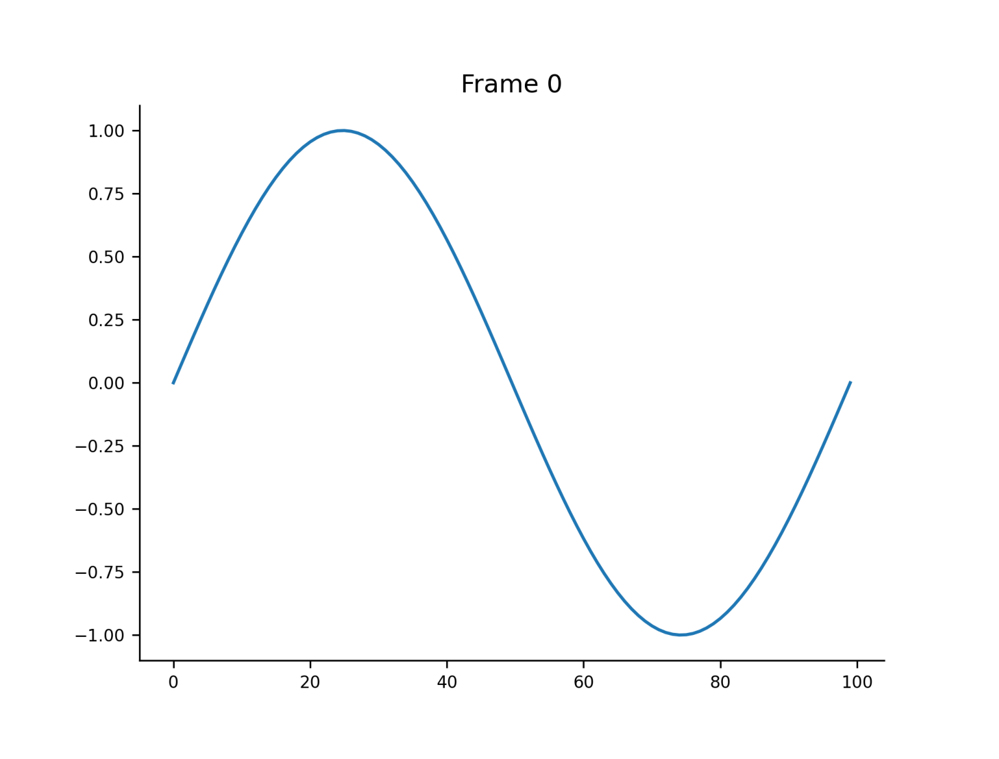

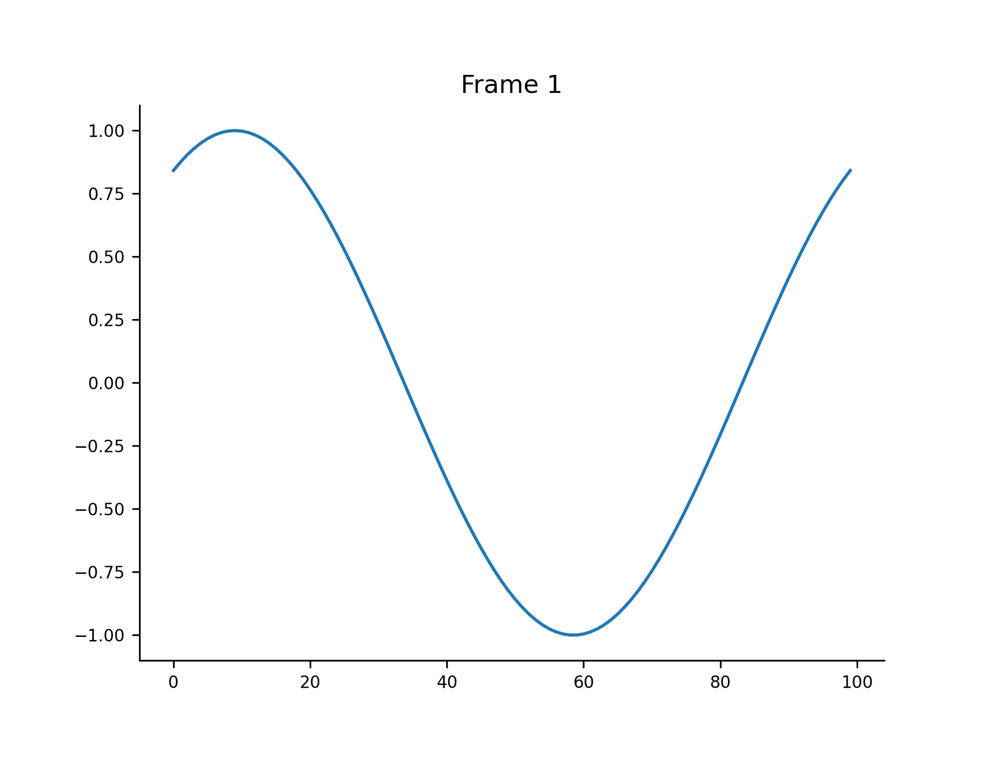

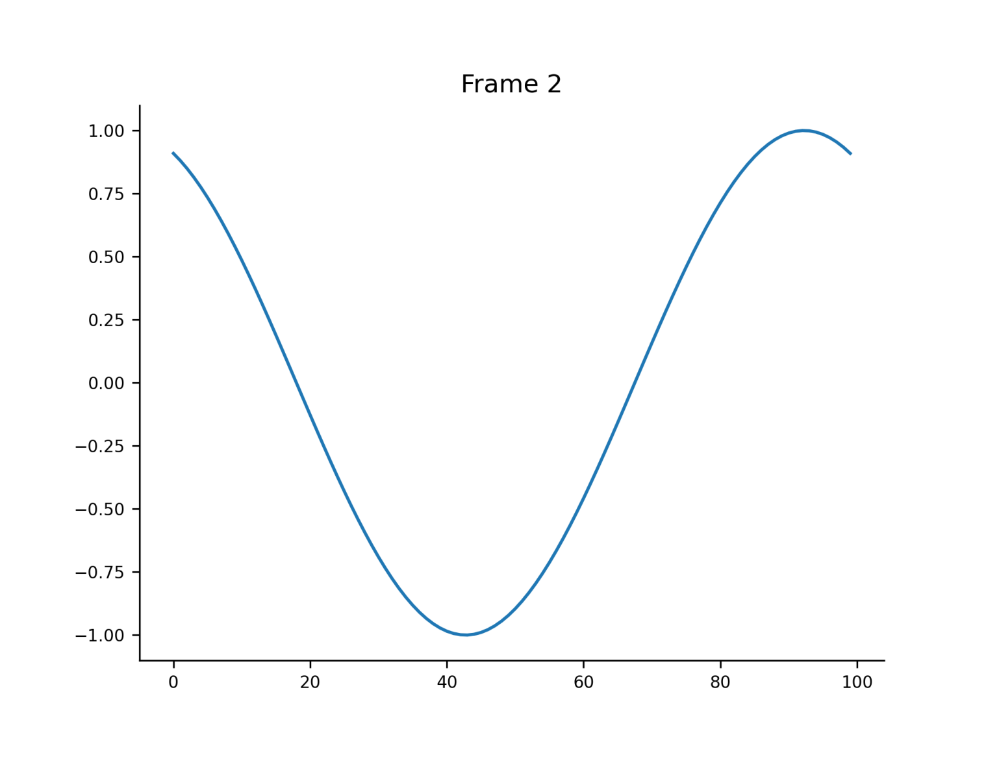

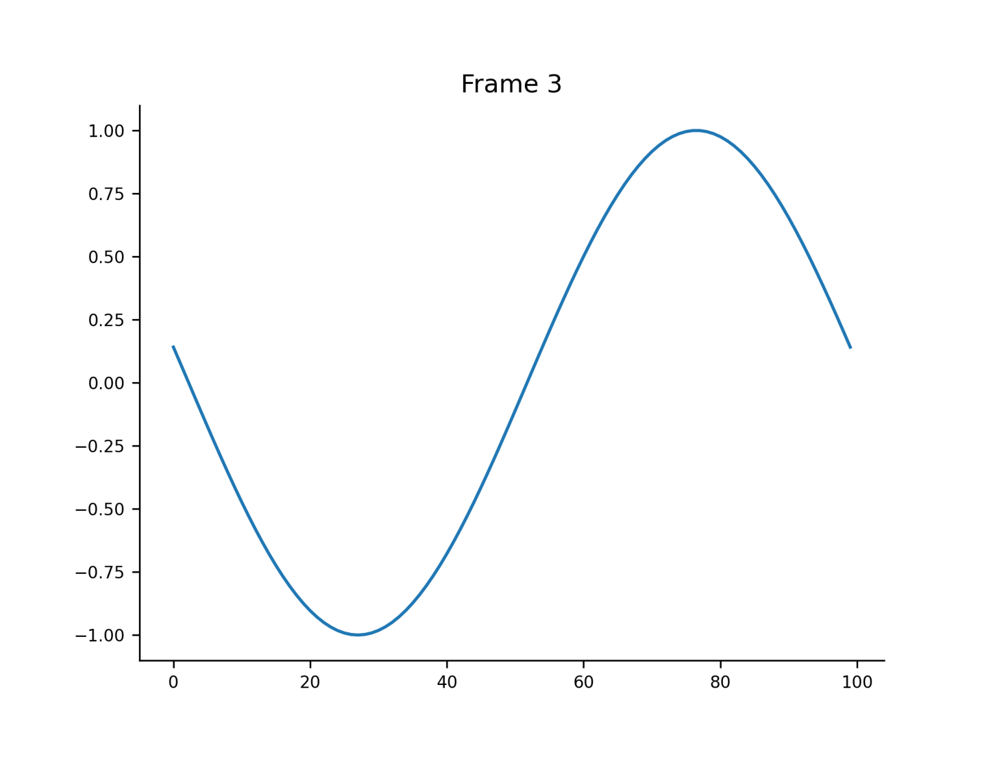

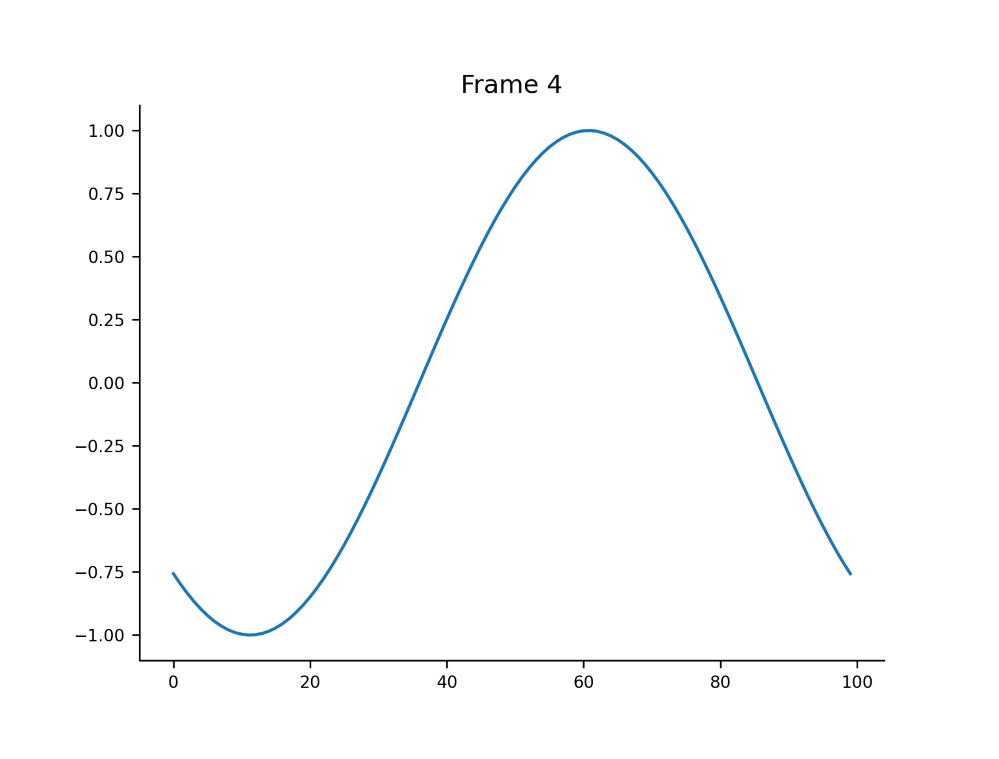

In [ ]:
for i, frame in enumerate(stack):
    plt.imshow(frame)
    plt.axis("off")
    plt.show()

In [ ]:
from ipywidgets import interact

def show_frame(i=0):
    plt.imshow(stack[i])
    plt.title(f"Frame {i}")
    plt.axis("off")
    plt.show()

interact(show_frame, i=(0, stack.shape[0]-1))

interactive(children=(IntSlider(value=0, description='i', max=4), Output()), _dom_classes=('widget-interact',)…

<function __main__.show_frame(i=0)>

Fitting KDE with Scott's Factor: 0.331
Fitting KDE with Scott's Factor: 0.284
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.257
Fitting KDE with Scott's Factor: 0.267
Fitting KDE with Scott's Factor: 0.302
Fitting KDE with Scott's Factor: 0.286
One-way ANOVA P-value: 0.069
Tukey posthoc tests conducted
Posthoc statistics saved to txt file


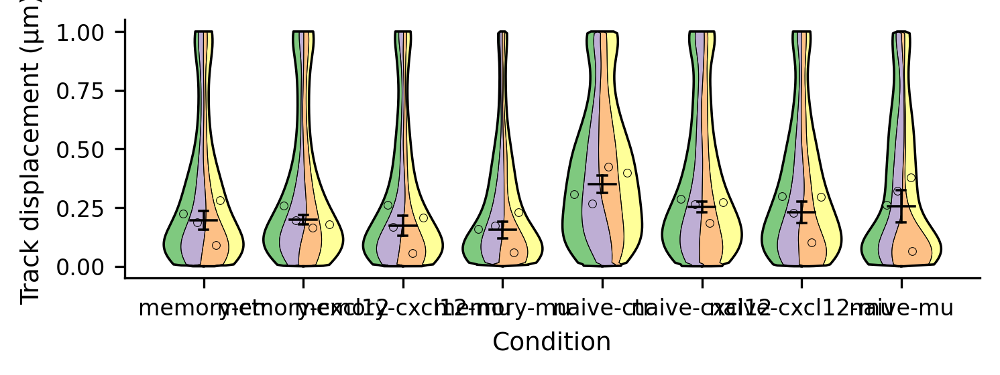

In [ ]:
sv = Superviolin(
    dataframe=TRACKS_DATAFRAME,
    condition="Condition", 
    value="Confinement ratio", 
    replicate="Replicate",
    centre_val="mean", 
    middle_vals="median", 
    error_bars="SEM",
    xlabel="Condition", 
    ylabel="Track displacement (µm)", 
    cmap="Accent",
    linewidth=0.85,
    sep_linewidth=0.25,
    # bw=0.9
    # ylimits="-25, 200"
)

sv.generate_plot()

Fitting KDE with Scott's Factor: 0.331
Fitting KDE with Scott's Factor: 0.284
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.257
Fitting KDE with Scott's Factor: 0.267
Fitting KDE with Scott's Factor: 0.302
Fitting KDE with Scott's Factor: 0.286
One-way ANOVA P-value: 0.069
Tukey posthoc tests conducted
Posthoc statistics saved to txt file


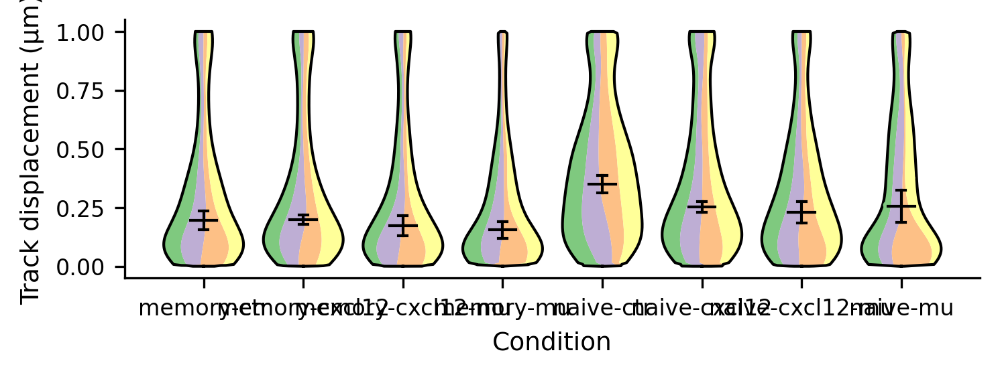

In [ ]:
sv = Superviolin(
    dataframe=TRACKS_DATAFRAME,
    condition="Condition", 
    value="Confinement ratio", 
    replicate="Replicate",
    centre_val="mean", 
    middle_vals="median", 
    error_bars="SEM",
    xlabel="Condition", 
    ylabel="Track displacement (µm)", 
    cmap="Accent",
    linewidth=1,
    sep_linewidth=0,
    # bw=0.9
    # ylimits="-25, 200"
)

sv.generate_plot()

Fitting KDE with Scott's Factor: 0.331
Fitting KDE with Scott's Factor: 0.284
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.257
Fitting KDE with Scott's Factor: 0.267
Fitting KDE with Scott's Factor: 0.302
Fitting KDE with Scott's Factor: 0.286
One-way ANOVA P-value: 0.069
Tukey posthoc tests conducted
Posthoc statistics saved to txt file


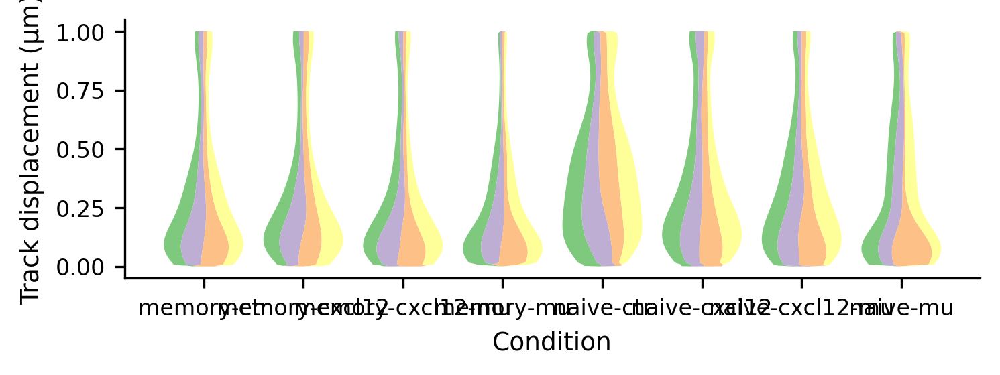

In [ ]:
sv = Superviolin(
    dataframe=TRACKS_DATAFRAME,
    condition="Condition", 
    value="Confinement ratio", 
    replicate="Replicate",
    centre_val="mean", 
    middle_vals="median", 
    error_bars="SEM",
    xlabel="Condition", 
    ylabel="Track displacement (µm)", 
    cmap="Accent",
    linewidth=0,
    sep_linewidth=0,
    # bw=0.9
    # ylimits="-25, 200"
)

sv.generate_plot()

In [ ]:

def _generate_random_color():
    """
    Generate a random color in hexadecimal format.

    """

    r = np.random.randint(0, 255)   # Red LED intensity
    g = np.random.randint(0, 255)   # Green LED intensity
    b = np.random.randint(0, 255)   # Blue LED intensity

    return '#{:02x}{:02x}{:02x}'.format(r, g, b)


def _generate_random_grey():
    """
    Generate a random grey color in hexadecimal format.

    """

    n = np.random.randint(0, 240)  # All LED intensities

    return '#{:02x}{:02x}{:02x}'.format(n, n, n)


def _make_cmap(elements, cmap):
    """
    Generate a qualitative colormap for a given list of elements.

    """

    n = len(elements)   # Number of elements in the dictionary
    if n == 0:          # Return an empty list if there are no elements
        return []       
    
    cmap = plt.get_cmap(cmap)                                   # Get the colormap
    colors = [mcolors.to_hex(cmap(i / n)) for i in range(n)]    # Generate a color for each element

    return colors


def _get_cmap(c_mode):
    """
    Get a colormap according to the selected color mode.

    """

    if c_mode == 'greyscale LUT':
        return plt.cm.gist_yarg
    elif c_mode == 'jet LUT':
        return plt.cm.jet
    elif c_mode == 'brg LUT':
        return plt.cm.brg
    elif c_mode == 'hot LUT':
        return plt.cm.hot
    elif c_mode == 'gnuplot LUT':
        return plt.cm.gnuplot
    elif c_mode == 'viridis LUT':
        return plt.cm.viridis
    elif c_mode == 'rainbow LUT':
        return plt.cm.rainbow
    elif c_mode == 'turbo LUT':
        return plt.cm.turbo
    elif c_mode == 'nipy_spectral LUT':
        return plt.cm.nipy_spectral
    elif c_mode == 'gist_ncar LUT':
        return plt.cm.gist_ncar
    else:
        return None


def _assign_marker(value, markers):
    """
    Qualitatively map a metric's percentile value to a symbol.

    """

    lut = []    # Initialize a list to store the ranges and corresponding symbols

    for key, val in markers.items():                # Iterate through the markers dictionary
        low, high = map(float, key.split('-'))      # Split the key into low and high values
        lut.append((low, high, val))                # Append the range and symbol to the list

    for low, high, symbol in lut:               # Return the symbol for the range that contains the given value
        if low <= value < high:                  # Check if the value falls within the range
            return symbol
    
    return list(markers.items())[-1][-1]            # Return the last symbol for thr 100th percentile (which is not included in the ranges)


def _get_markers(markers):
    """
    Get the markers according to the selected mode.

    """

    if markers == 'cell':
        return _cell
    elif markers == 'scaled':
        return _scaled
    elif markers == 'trains':
        return _trains
    elif markers == 'random':
        return _random
    elif markers == 'farm':
        return _farm
    elif markers == 'safari':
        return _safari
    elif markers == 'insects':
        return _insects
    elif markers == 'birds':
        return _birds
    elif markers == 'forest':
        return _forest
    elif markers == 'aquarium':
        return _aquarium

In [ ]:
from matplotlib import rcParams as params

# # Lightweight defaults (safe to override globally if you want)
# params.update({
#     "xtick.labelsize": 8,
#     "ytick.labelsize": 8,
#     "axes.labelsize": 9,
#     "axes.spines.right": False,
#     "axes.spines.top": False,
#     "figure.dpi": 300,
#     "legend.fontsize": 10,
# })


In [ ]:
class CstmSuperviolin:
    def __init__(self, metric="value", filename="", data_format="tidy", units: dict = None,
                 centre_val="mean", middle_vals="mean", error_bars="SEM",
                 paired_data="no", stats_on_plot="no",
                 total_width=0.8, outline_lw=1, dataframe=False,
                 sep_lw=0, bullet_lw=0.75, errorbar_lw=1, bullet_size=50, palette="Accent", use_my_colors=True,
                 bw="None", show_legend=True, plot_width=12, plot_height=5):
        self.errors = []
        self.df = dataframe
        self.x = "Condition"
        self.y = metric
        self.rep = "Replicate"
        self.units = units
        self.use_my_colors = use_my_colors
        self.palette = palette
        self.outline_lw = outline_lw
        self.sep_linewidth = sep_lw
        self.bullet_linewidth = bullet_lw
        self.errorbar_linewidth = errorbar_lw
        self.bullet_size = bullet_size
        self.middle_vals = middle_vals
        self.centre_val = centre_val
        self.paired = paired_data
        self.stats_on_plot = stats_on_plot
        self.total_width = total_width
        self.error_bars = error_bars
        self.show_legend = show_legend
        self._on_legend = []
        self.plot_width = plot_width
        self.plot_height = plot_height

        if bw != "None":
            self.bw = bw
        else:
            self.bw = None
            
        qualitative = ["Pastel1", "Pastel2", "Paired", "Accent", "Dark2",
                       "Set1", "Set2", "Set3", "tab10", "tab20", "tab20b",
                       "tab20c"]
        
        # ensure dataframe is loaded
        if self._check_df(filename, data_format):
            
            # ensure columns are all present in the dataframe
            if self._cols_in_df():
                
                # force Condition and Replicate to string types
                self.df[self.x] = self.df[self.x].astype(str)
                self.df[self.rep] = self.df[self.rep].astype(str)
                
                # organize subgroups
                self.subgroups = tuple(sorted(self.df[self.x].unique().tolist()))
                
                # dictionary of arrays for subgroup data
                # loop through the keys and add an empty list
                # when the replicate numbers don"t match
                self.subgroup_dict = dict(
                    zip(self.subgroups,
                        [{"norm_wy" : [], "px" : []} for i in self.subgroups])
                    )
    
                self.unique_reps = tuple(self.df[self.rep].unique())
                
                # make sure there"s enough colours for 
                # each subgroup when instantiating
                try:    
                    if self.use_my_colors:
                        cmap = _build_replicate_palette(self.df, palette_fallback=self.palette)
                        self.cmap = cmap
                        self.colours = [cmap[rep] for rep in self.unique_reps]
                    else:
                        self.cm = plt.get_cmap(self.palette)
                        self.colours = [self.cm(i / self.cm.N) for i in range(len(self.unique_reps))]
                except Exception as e:
                    print(e)
                    print("Random colours were created for each unique replicate.")
                    # colours = {rep: _generate_random_color() for rep in self.unique_reps}
                    colours = {rep: _generate_random_color() for rep in self.unique_reps}
                    self.colours = [colours[rep] for rep in self.unique_reps]


        self.check_errors()
    
    def check_errors(self):
        num_errors = len(self.errors)
        if num_errors == 1:
            print("Caught 1 error")
            return True
        elif num_errors > 1:
            print(f"Caught {len(self.errors)} errors")
            for i,e in enumerate(self.errors, 1):
                print(f"\t{i}. {e}")
            return True
        else:
            return False
        
                    
    def generate_plot(self):
        """
        Generate Violin SuperPlot by calling get_kde_data, plot_subgroups,
        and get_statistics if the errors list attribute is empty.

        Returns
        -------
        None.

        """
        # if no errors exist, create the superplot. Otherwise, report errors
        errors = self.check_errors()
        if not errors:
            self.get_kde_data(self.bw)
            self.plot_subgroups(self.centre_val, self.middle_vals,
                                self.error_bars,
                                self.total_width, self.outline_lw,
                                self.stats_on_plot, self.show_legend)
        
    def _check_df(self, filename, data_format):
        """
        Read dataframe if file extension is valid. 

        Parameters
        ----------
        filename : string
            name of the file containing the data for the Violin SuperPlot.
            Must be CSV or an Excel workbook
        data_format : string
            either "tidy" or "untidy" based on format of the data

        Returns
        -------
        bool
            True, if a Pandas DataFrame object was created using the filename,
            else False

        """
        if "bool" in str(type(self.df)):
            if filename.endswith("csv"):
                self.df = pd.read_csv(filename)
                return True
            elif ".xl" in filename:
                if data_format == "tidy":
                    self.df = pd.read_excel(filename)
                else:
                    self._make_tidy(filename)
                return True
            else:
                self.errors.append("Incorrect filename or unsupported filetype")
                return False
        else:
            return True
    
    def _cols_in_df(self):
        """
        Check if all column names specified by the user are present in the 
        self.df DataFrame

        Returns
        -------
        bool
            True if all supplied column names are present in the df attribute

        """
        cols = [self.x, self.y, self.rep]
        missing_cols = [col for col in cols if col not in self.df.columns]
        if len(missing_cols) != 0:
            if len(missing_cols) == 1:
                self.errors.append("Variable not found: " + missing_cols[0])
            else:
                add_on = "Missing variables: " + ", ".join(missing_cols)
                self.errors.append(add_on)
            return False
        else:
            return True

    def get_kde_data(self, bw=None):
        """
        Fit kernel density estimators to the replicate of each condition,
        generate list of x and y co-ordinates of the histogram,
        stack them, and add to the subgroup_dict attribute

        Parameters
        ----------
        bw : float
            The percent smoothing to apply to the stripe outlines.
            Values should be between 0 and 1. The default value will result
            in an "optimal" value being used to smoothen the stripes. This
            value is calculated using Scott's Rule

        Returns
        -------
        None.

        """
        for group in self.subgroups:
            px = []
            norm_wy = []
            min_cuts = []
            max_cuts = []
            
            # get limits for fitting the kde 
            for rep in self.unique_reps:
                sub = self.df[(self.df[self.rep] == rep) &
                              (self.df[self.x] == group)][self.y]
                min_cuts.append(sub.min())
                max_cuts.append(sub.max())
            min_cuts = sorted(min_cuts)
            max_cuts = sorted(max_cuts)
            
            # make linespace of points from highest_min_cut to lowest_max_cut
            points1 = list(np.linspace(np.nanmin(min_cuts),
                                       np.nanmax(max_cuts),
                                       num = 128))
            points = sorted(list(set(min_cuts + points1 + max_cuts)))
            
            for rep in self.unique_reps:
                
                # first point to catch an empty list
                # caused by uneven rep numbers
                try:
                    sub = self.df[(self.df[self.rep] == rep) &
                                  (self.df[self.x] == group)][self.y]
                    arr = np.array(sub)
                    
                    # remove nan or inf values which 
                    # could cause a kde ValueError
                    arr = arr[~(np.isnan(arr))]
                    kde = gaussian_kde(arr, bw_method=bw)
                    kde_points = kde.evaluate(points)
                    # kde_points = kde_points - np.nanmin(kde_points) #why?
                    
                    # use min and max to make the kde_points
                    # outside that dataset = 0
                    idx_min = min_cuts.index(arr.min())
                    idx_max = max_cuts.index(arr.max())
                    if idx_min > 0:
                        for p in range(idx_min):
                            kde_points[p] = 0
                    for idx in range(idx_max - len(max_cuts), 0):
                        if idx_max - len(max_cuts) != -1:
                            kde_points[idx+1] = 0
                    
                    # remove nan prior to combining arrays into dictionary
                    kde_wo_nan = self._interpolate_nan(kde_points)
                    points_wo_nan = self._interpolate_nan(points)
                    
                    # normalize each stripe's area to a constant
                    # so that they all have the same area when plotted
                    area = 30
                    kde_wo_nan = (area / sum(kde_wo_nan)) * kde_wo_nan
                    
                    norm_wy.append(kde_wo_nan)
                    px.append(points_wo_nan)
                except ValueError:
                    norm_wy.append([])
                    px.append(self._interpolate_nan(points))
            px = np.array(px)
            
            # print Scott's factor to the console to help users
            # choose alternative values for bw
            try:
                if bw == None:
                    scott = kde.scotts_factor()
                    print(f"Fitting KDE with Scott's Factor: {scott:.3f}")
            except UnboundLocalError:
                pass
            
            # catch the error when there is an empty list added to the dictionary
            length = max([len(e) for e in norm_wy])
            
            # rescale norm_wy for display purposes
            norm_wy = [a if len(a) > 0 else np.zeros(length) for a in norm_wy]
            norm_wy = np.array(norm_wy)
            norm_wy = np.cumsum(norm_wy, axis = 0)
            try:
                norm_wy = norm_wy / np.nanmax(norm_wy) # [0,1]
            except ValueError:
                print("Failed to normalize y values")
            
            # update the dictionary with the normalized data
            # and corresponding x points
            self.subgroup_dict[group]["norm_wy"] = norm_wy
            self.subgroup_dict[group]["px"] = px
    
    @staticmethod
    def _interpolate_nan(arr):
        """
        Interpolate NaN values in numpy array of x co-ordinates of each fitted
        kernel density estimator to prevent gaps in the stripes of each Violin
        SuperPlot

        Parameters
        ----------
        arr : numpy array
            array of x co-ordinates of a fitted kde

        Returns
        -------
        arr : TYPE
            array of x co-ordinates with interpolation for each NaN value
            if present

        """
        diffs = np.diff(arr, axis=0)
        median_val = np.nanmedian(diffs)
        nan_idx = np.where(np.isnan(arr))
        if nan_idx[0].size != 0:
            arr[nan_idx[0][0]] = arr[nan_idx[0][0] + 1] - median_val
        return arr
    
    def _single_subgroup_plot(self, group, axis_point, mid_df,
                              total_width, linewidth):
        """
        Plot a Violin SuperPlot for the given condition

        Parameters
        ----------
        group : string
            Categorical condition to be plotted on the x axis
        axis_point : integer
            The point on the x-axis over which the Violin SuperPlot will be
            centred
        mid_df : Pandas DataFrame
            Dataframe containing the middle values of each replicate
        total_width : float
            Half the width of each Violin SuperPlot
        linewidth : float
            Width value for the outlines of each Violin SuperPlot and the 
            summary statistics skeleton plot

        Returns
        -------
        None.

        """
        
        # select scatter size based on number of replicates
        
        norm_wy = self.subgroup_dict[group]["norm_wy"]
        px = self.subgroup_dict[group]["px"]
        right_sides = np.array([norm_wy[-1]*-1 + i*2 for i in norm_wy])
        
        # create array of 3 lines which denote the 3 replicates on the plot
        new_wy = []
        for i in range(len(px)):
            if i == 0:
                newline = np.append(norm_wy[-1]*-1,
                                    np.flipud(right_sides[i]))
            else:
                newline = np.append(right_sides[i-1],
                                    np.flipud(right_sides[i]))
            new_wy.append(newline)
        new_wy = np.array(new_wy)
        
        # use last array to plot the outline
        outline_y = np.append(px[-1], np.flipud(px[-1]))
        append_param = np.flipud(norm_wy[-1]) * -1
        outline_x = np.append(norm_wy[-1],
                              append_param)*total_width + axis_point
        
        # Temporary fix; find original source of the
        # bug and correct when time allows
        if outline_x[0] != outline_x[-1]:
            xval = round(outline_x[0], 4)
            yval = outline_y[0]
            outline_x = np.insert(outline_x, 0, xval)
            outline_x = np.insert(outline_x, outline_x.size, xval)
            outline_y = np.insert(outline_y, 0, yval)
            outline_y = np.insert(outline_y, outline_y.size, yval)
        
        for i,a in enumerate(self.unique_reps):
            reshaped_x = np.append(px[i-1], np.flipud(px[i-1]))
            mid_val = mid_df[mid_df[self.rep] == a][self.y].values
            reshaped_y = new_wy[i] * total_width  + axis_point
            
            # check if _on_legend contains the rep
            if a in self._on_legend:
                lbl = ""
            else:
                lbl = a
                self._on_legend.append(a)
            
            # plot separating lines and stripes
            plt.plot(reshaped_y, reshaped_x, c="k",
                     linewidth=self.sep_linewidth)
            plt.fill(reshaped_y, reshaped_x, color=self.colours[i],
                     label=lbl, linewidth=self.sep_linewidth)
            
            # get the mid_val each replicate and find it in reshaped_x
            # then get corresponding point in reshaped_x to plot the points
            if mid_val.size > 0: # account for empty mid_val
                arr = reshaped_x[np.logical_not(np.isnan(reshaped_x))]
                nearest = self._find_nearest(arr, mid_val[0])
                
                # find the indices of nearest in new_wy
                # there will be two because new_wy is a loop
                idx = np.where(reshaped_x == nearest)
                x_vals = reshaped_y[idx]
                x_val = x_vals[0] + ((x_vals[1] - x_vals[0]) / 2)
                plt.scatter(x_val, mid_val[0], facecolors=self.colours[i],
                            edgecolors="Black", linewidth=self.bullet_linewidth,
                            zorder=10, marker="o", s=self.bullet_size)
        plt.plot(outline_x, outline_y, color="Black", linewidth=self.outline_lw)
        
    def plot_subgroups(self, centre_val="mean", middle_vals="mean", error_bars="SEM",
                       total_width=0.8, linewidth=1,
                       show_stats="no", show_legend=True):
        """
        Plot all subgroups of the df attribute

        Parameters
        ----------
        centre_val : string
            Central measure used for the skeleton plot. Either mean or median
        middle_vals : string
            Central measure of each replicate. Either mean, median, or robust
            mean
        error_bars : string
            Method for displaying error bars in the skeleton plot. Either SEM
            for standard error of the mean, SD for standard deviation,
            or CI for 95% confidence intervals
        total_width : float
            Half the width of each Violin SuperPlot
        linewidth : float
            Width value for the outlines of each Violin SuperPlot and the 
            summary statistics skeleton plot
        show_stats : string
            Either "yes" or "no" to overlay the statistics on the plot
        show_legend : bool
            True to show a legend on the generated plot

        Returns
        -------
        None.

        """
        plt.figure(figsize=(self.plot_width, self.plot_height))
        ticks = []
        lbls = []
        
        # width of the bars
        median_width = 0.4
        for i,a in enumerate(self.subgroups):
            ticks.append(i*2)
            lbls.append(a)            
            
            # calculate the mean/median value for
            # all replicates of the variable
            sub = self.df[self.df[self.x] == a]
            
            # robust mean calculates mean using data
            # between the 2.5 and 97.5 percentiles
            if middle_vals == "robust":
                
                # loop through replicates in sub
                subs = []
                for rep in sub[self.rep].unique():
                    
                    # drop rows containing NaN values as
                    # they mess up the subsetting
                    s = sub[sub[self.rep] == rep].dropna()
                    lower = np.percentile(s[self.y], 2.5)
                    upper = np.percentile(s[self.y], 97.5)
                    s = s.query(f"{lower} <= {self.y} <= {upper}")
                    subs.append(s)
                sub = pd.concat(subs)
                middle_vals = "mean"
            
            # calculate mean from remaining data
            means = sub.groupby(self.rep,
                                as_index=False).agg({self.y : middle_vals})
            self._single_subgroup_plot(a, i*2, mid_df=means,
                                       total_width=total_width,
                                       linewidth=self.sep_linewidth)
            
            # get mean or median line of the skeleton plot
            if centre_val == "mean":
                mid_val = means[self.y].mean()
            else:
                mid_val = means[self.y].median()
            
            # get error bars for the skeleton plot
            if error_bars == "SEM":
                sem = means[self.y].sem()
                upper = mid_val + sem
                lower = mid_val - sem
            elif error_bars == "SD":
                upper = mid_val + means[self.y].std()
                lower = mid_val - means[self.y].std()
            else:
                lower, upper = norm.interval(0.95, loc=means[self.y].mean(),
                                      scale=means[self.y].std())
            
            # plot horizontal lines across the column, centered on the tick
            plt.plot([i*2 - median_width / 1.5, i*2 + median_width / 1.5],
                         [mid_val, mid_val], lw=self.errorbar_linewidth, color="k",
                         zorder=20)
            for b in [upper, lower]:
                plt.plot([i*2 - median_width / 4.5, i*2 + median_width / 4.5],
                         [b, b], lw=self.errorbar_linewidth, color="k", zorder=20)
            
            # plot vertical lines connecting the limits
            plt.plot([i*2, i*2], [lower, upper], lw=self.errorbar_linewidth, color="k",
                     zorder=20)
        
        # add legend
        if show_legend:
            plt.legend(loc=1, bbox_to_anchor=(1.1,1.1), frameon=True, fontsize=self.plot_height * 1.5, edgecolor='black', fancybox=False, framealpha=0.65)
            
        
        plt.xticks(ticks, lbls, rotation=345)
        plt.ylabel(f"{self.y} {self.units.get(self.y) if self.units else ''}")
        plt.xlabel("Condition")

        return plt.gcf()
        
    @staticmethod
    def _find_nearest(array, value):
        """
        Helper function to find the value of an array nearest to the input
        value argument

        Parameters
        ----------
        array : numpy array
            array of x co-ordinates from the fitted kde
        value : float
            the middle value of 

        Returns
        -------
        float
            nearest value in array to the input value argument

        """
        array = np.asarray(array)
        idx = (np.abs(array - value)).argmin()
        return array[idx]


Fitting KDE with Scott's Factor: 0.331
Fitting KDE with Scott's Factor: 0.284
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.292
Fitting KDE with Scott's Factor: 0.257
Fitting KDE with Scott's Factor: 0.267
Fitting KDE with Scott's Factor: 0.302
Fitting KDE with Scott's Factor: 0.286


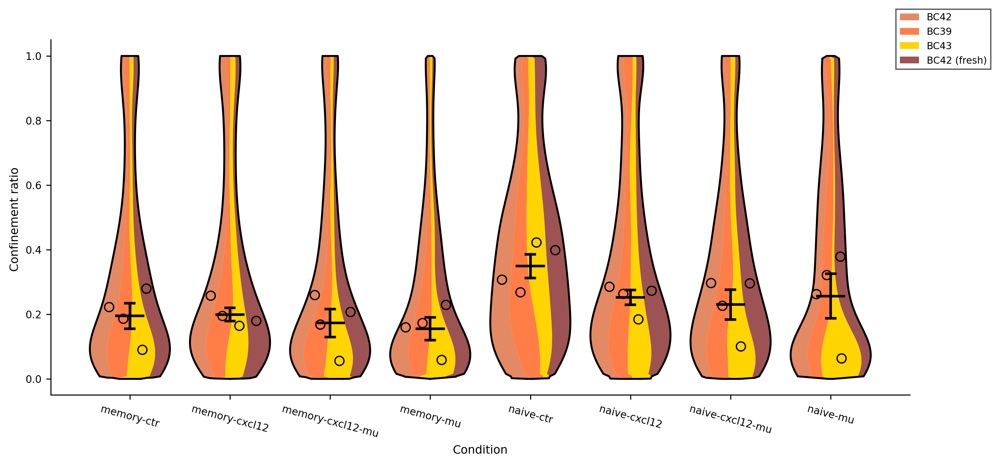

In [ ]:
plot = CstmSuperviolin(
    dataframe=TRACKS_DATAFRAME,
    metric="Confinement ratio",
    centre_val="mean", 
    middle_vals="median", 
    error_bars="SEM",
    palette="Accent",
    use_my_colors=True,
    outline_lw=1.5,
    sep_lw=0,
    bullet_lw=1,
    errorbar_lw=2,
    bullet_size=50,
    plot_width=12,
    plot_height=5,
)

plot.generate_plot()

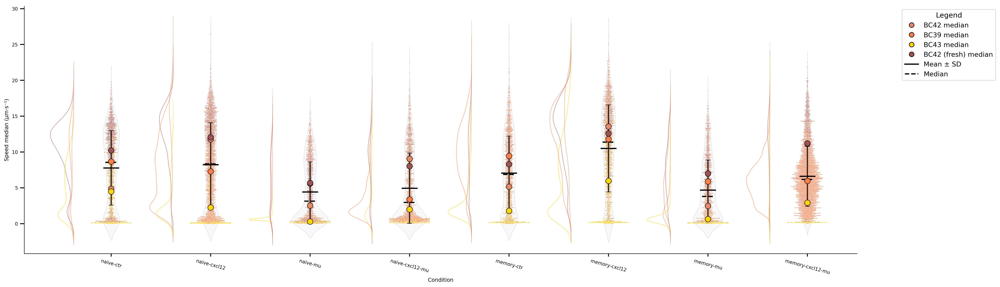

In [ ]:
from itertools import chain
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines

def SwarmPlot(
    df: pd.DataFrame,
    metric: str,
    *args,
    title: str = '',
    palette: str = 'tab10',

    show_swarm: bool = True,
    swarm_size: int = 1,
    swarm_outline_color: str = 'black',
    swarm_alpha: float = 0.75,

    show_violin: bool = True,
    violin_fill_color: str = 'whitesmoke',
    violin_edge_color: str = 'lightgrey',
    violin_alpha: float = 0.5,
    violin_outline_width: float = 1,

    show_mean: bool = True,
    mean_span: float = 0.16,
    mean_color: str = 'black',
    mean_ls: str = '-',
    show_median: bool = True,
    median_span: float = 0.12,
    median_color: str = 'black',
    median_ls: str = '--',
    line_width: float = 2,

    show_error_bars: bool = True,
    errorbar_capsize: int = 4,
    errorbar_color: str = 'black',
    errorbar_lw: int = 2,
    errorbar_alpha: float = 0.8,

    show_mean_balls: bool = True,
    mean_ball_size: int = 90,
    mean_ball_outline_color: str = 'black',
    mean_ball_outline_width: float = 0.75,
    mean_ball_alpha: int = 1,
    show_median_balls: bool = False,
    median_ball_size: int = 70,
    median_ball_outline_color: str = 'black',
    median_ball_outline_width: float = 0.75,
    median_ball_alpha: int = 1,

    show_kde: bool = False,
    kde_inset_width: float = 0.5,
    kde_outline: float = 1,
    kde_alpha: float = 0.5,
    kde_fill: bool = False,

    show_legend: bool = True,
    show_grid: bool = False,
    open_spine: bool = True,

    plot_width: int = 20,
    plot_height: int = 9,
):
    """
    Faster drop-in SwarmPlot: same params and visuals (mean/median lines,
    error bars, violins, swarm, replicate markers, optional KDE insets).
    """

    plt.figure(figsize=(plot_width, plot_height))
    ax = plt.gca()

    if df is None or df.empty:
        return plt.gcf()

    _df = df.copy()

    # === condition order & optional spacers (for KDE layout) ===
    conditions = _df['Condition'].unique().tolist()

    if show_kde:
        spaced_conditions = ["spacer_0"] + list(
            chain.from_iterable(
                (cond, f"spacer_{i+1}") if i < len(conditions) - 1 else (cond,)
                for i, cond in enumerate(conditions)
            )
        )
        # Categorical with unobserved categories retained (order matters for aligning x)
        _df['Condition'] = pd.Categorical(_df['Condition'],
                                          categories=spaced_conditions,
                                          ordered=True)
        categories_for_stats = spaced_conditions
    else:
        _df['Condition'] = pd.Categorical(_df['Condition'],
                                          categories=conditions,
                                          ordered=True)
        categories_for_stats = conditions

    _palette = _build_replicate_palette(_df, palette_fallback=palette)

    # === stats (single pass) ===
    # keep all categories (observed=False) so spacers appear with NaNs
    _cond_stats = (
        _df.groupby('Condition', observed=False)[metric]
           .agg(mean='mean', median='median', std='std', count='count')
           .reindex(categories_for_stats)        # align to category order
           .reset_index()
    )
    _rep_stats = (
        _df.groupby(['Condition', 'Replicate'], observed=False)[metric]
           .agg(mean='mean', median='median')
           .reset_index()
    )

    # === base layers (seaborn handles packing/jitter efficiently) ===
    if show_swarm:
        sp = sns.swarmplot(
            data=_df,
            x="Condition",
            y=metric,
            hue='Replicate',
            palette=_palette,
            size=swarm_size,
            edgecolor=swarm_outline_color,
            dodge=False,
            alpha=swarm_alpha,
            legend=False,
            zorder=1,
            ax=ax,
        )

    if show_violin:
        sns.violinplot(
            data=_df,
            x='Condition',
            y=metric,
            color=violin_fill_color,
            edgecolor=violin_edge_color if violin_edge_color else None,
            linewidth=violin_outline_width,   # (seaborn uses 'linewidth')
            inner=None,
            gap=0.1,
            alpha=violin_alpha,
            zorder=0,
            ax=ax,
        )

    # === replicate mean/median markers (single scatter each) ===
    if show_mean_balls:
        sns.scatterplot(
            data=_rep_stats,
            x='Condition', y='mean',
            hue='Replicate',
            palette=_palette,
            edgecolor=mean_ball_outline_color,
            s=mean_ball_size,
            legend=False,
            alpha=mean_ball_alpha,
            linewidth=mean_ball_outline_width,
            zorder=4,
            ax=ax,
        )

    if show_median_balls:
        sns.scatterplot(
            data=_rep_stats,
            x='Condition', y='median',
            hue='Replicate',
            palette=_palette,
            edgecolor=median_ball_outline_color,
            s=median_ball_size,
            legend=False,
            alpha=median_ball_alpha,
            linewidth=median_ball_outline_width,
            zorder=4,
            ax=ax,
        )

    # === vectorized lines & error bars (big win) ===
    # Build x centers as 0..N-1 in category order (seaborn does the same internally)
    n = len(categories_for_stats)
    x_centers = np.arange(n)

    # Mask out spacers so we don't draw stats on them
    is_spacer = _cond_stats['Condition'].astype(str).str.startswith('spacer')
    valid = ~is_spacer

    y_mean = _cond_stats.loc[valid, 'mean'].to_numpy()
    y_median = _cond_stats.loc[valid, 'median'].to_numpy()
    y_std = _cond_stats.loc[valid, 'std'].to_numpy()
    x_valid = x_centers[valid.to_numpy()]

    # Mean & median short spans using vectorized hlines
    if show_mean and y_mean.size:
        xmin = x_valid - mean_span
        xmax = x_valid + mean_span
        ax.hlines(y_mean, xmin, xmax,
                  colors=mean_color, linestyles=mean_ls,
                  linewidths=line_width, zorder=3, label='Mean')

    if show_median and y_median.size:
        xmin_m = x_valid - median_span
        xmax_m = x_valid + median_span
        # If both present, only label once (matplotlib de-dupes identical labels later)
        ax.hlines(y_median, xmin_m, xmax_m,
                  colors=median_color, linestyles=median_ls,
                  linewidths=line_width, zorder=3,
                  label=('Median' if not show_mean else None))

    if show_error_bars and y_mean.size:
        ax.errorbar(
            x_valid, y_mean, yerr=y_std,
            fmt='none',
            color=errorbar_color,
            alpha=errorbar_alpha,
            linewidth=errorbar_lw,
            capsize=errorbar_capsize,
            zorder=3,
            label=('Mean ± SD' if (show_mean or show_median) else 'SD')
        )

    # === KDE insets (loop only once per actual condition) ===
    if show_kde:
        # After base layers, use established y-limits to size insets
        y_ax_min, y_ax_max = ax.get_ylim()

        # Iterate over actual conditions (even positions in spaced layout)
        for i, cond in enumerate(conditions):
            group_df = _df[_df['Condition'] == cond]
            if group_df.empty:
                continue

            # inset geometry in data coords
            x_pos = 2 * i   # even positions: 0,2,4...
            offset_x = 0.25
            inset_height = y_ax_max - (y_ax_max - group_df[metric].max()) + abs(y_ax_min * 2)

            inset_ax = ax.inset_axes(
                [x_pos - offset_x, y_ax_min, kde_inset_width, inset_height],
                transform=ax.transData, zorder=0, clip_on=True
            )
            sns.kdeplot(
                data=group_df, y=metric, hue='Replicate',
                fill=kde_fill, alpha=kde_alpha, lw=kde_outline,
                palette=_palette, ax=inset_ax, legend=False,
                zorder=0, clip=(y_ax_min, y_ax_max),
            )
            inset_ax.invert_xaxis()
            inset_ax.set_xticks([]); inset_ax.set_yticks([])
            inset_ax.set_xlabel(''); inset_ax.set_ylabel('')
            sns.despine(ax=inset_ax, left=True, bottom=True, top=True, right=True)

        # Ticks: show only real conditions
        ticks = [i for i, lbl in enumerate(categories_for_stats) if not str(lbl).startswith('spacer')]
        labels = [categories_for_stats[i] for i in ticks]
        plt.xticks(ticks=ticks, labels=labels)
        plt.xlim(-0.75, len(categories_for_stats))

    # === axes cosmetics (unchanged) ===
    plt.title(title)
    plt.xlabel("Condition")
    plt.ylabel(f"{metric} {SetUnits(t='s').get(metric)}")

    if show_legend:
        handles, labels = [], []

        # Replicate entries
        for r in _df['Replicate'].astype(str).unique().tolist():
            c = _palette.get(r, 'grey')
            handles.append(mlines.Line2D([], [], linestyle='None',
                                         marker='o', markersize=8,
                                         markerfacecolor=c,
                                         markeredgecolor='black',
                                         label=(str(r) + " median")))
            labels.append(str(r) + " median")

        # Stats entries (mirror your original logic)
        if show_mean and not show_error_bars:
            handles.append(mlines.Line2D([], [], color=mean_color,
                                         linestyle=mean_ls, linewidth=line_width,
                                         label='Mean'))
            labels.append('Mean')
        elif show_error_bars and not show_mean:
            handles.append(mlines.Line2D([], [], color=errorbar_color,
                                         linestyle='-', linewidth=errorbar_lw,
                                         marker='_', markersize=10,
                                         label='SD'))
            labels.append('SD')
        elif show_mean and show_error_bars:
            handles.append(mlines.Line2D([], [], color=errorbar_color,
                                         linestyle='-', linewidth=errorbar_lw,
                                         marker='_', markersize=10,
                                         label='Mean ± SD'))
            labels.append('Mean ± SD')

        if show_median:
            handles.append(mlines.Line2D([], [], color=median_color,
                                         linestyle=median_ls, linewidth=line_width,
                                         label='Median'))
            labels.append('Median')

        leg = ax.legend(handles, labels, title='Legend',
                        title_fontsize=12, fontsize=10,
                        loc='upper right', bbox_to_anchor=(1.15, 1),
                        frameon=True)
        try:
            sns.move_legend(ax, "upper left", bbox_to_anchor=(1.05, 1))
        except Exception:
            pass
    else:
        try:
            plt.legend().remove()
        except Exception:
            pass

    sns.despine(top=open_spine, right=open_spine, bottom=False, left=False)
    plt.tick_params(axis='y', which='major', length=7, width=1.5, direction='out', color='black')
    plt.tick_params(axis='x', which='major', length=5, width=1.5, direction='out', color='black', rotation=345)
    if show_grid:
        plt.grid(show_grid, axis='y', color='lightgrey', linewidth=1.5, alpha=0.2)
    else:
        plt.grid(False)

    # Keep your legend move safeguard
    try:
        if plt.gca().get_legend() is not None:
            sns.move_legend(ax, "upper left", bbox_to_anchor=(1.05, 1), fontsize=plot_height * 1.5)
    except Exception:
        try:
            ax = plt.gca()
            if plt.gca().get_legend() is not None:
                sns.move_legend(ax, "upper left", bbox_to_anchor=(1.05, 1), fontsize=plot_height * 1.5)
        except Exception:
            pass

    plt.show()

# SwarmPlot(TRACKS_DATAFRAME, 'Speed median', show_kde=False)
SwarmPlot(TRACKS_DATAFRAME, 'Speed median', show_kde=True, plot_width=25, plot_height=7.5)

In [ ]:
def _get_cmap(c_mode):
    c_mode = c_mode.replace("nipy-spectral", "nipy_spectral")
    if c_mode == 'greyscale LUT': return plt.cm.gist_yarg
    elif c_mode == 'jet LUT': return plt.cm.jet
    elif c_mode == 'brg LUT': return plt.cm.brg
    elif c_mode == 'hot LUT': return plt.cm.hot
    elif c_mode == 'gnuplot LUT': return plt.cm.gnuplot
    elif c_mode == 'viridis LUT': return plt.cm.viridis
    elif c_mode == 'rainbow LUT': return plt.cm.rainbow
    elif c_mode == 'turbo LUT': return plt.cm.turbo
    elif c_mode == 'nipy-spectral LUT': return plt.cm.nipy_spectral
    elif c_mode == 'gist-ncar LUT': return plt.cm.gist_ncar
    else: return None

In [ ]:
TracksMarkers = {
        "circle-full": {"symbol": "o", "fill": True},
        "circle-empty": {"symbol": "o", "fill": False},
        "octagon-full": {"symbol": "p", "fill": True},
        "octagon-empty": {"symbol": "p", "fill": False},
        "pentagon-full": {"symbol": "P", "fill": True},
        "pentagon-empty": {"symbol": "P", "fill": False},
        "diamond-full": {"symbol": "D", "fill": True},
        "diamond-empty": {"symbol": "D", "fill": False},
    }

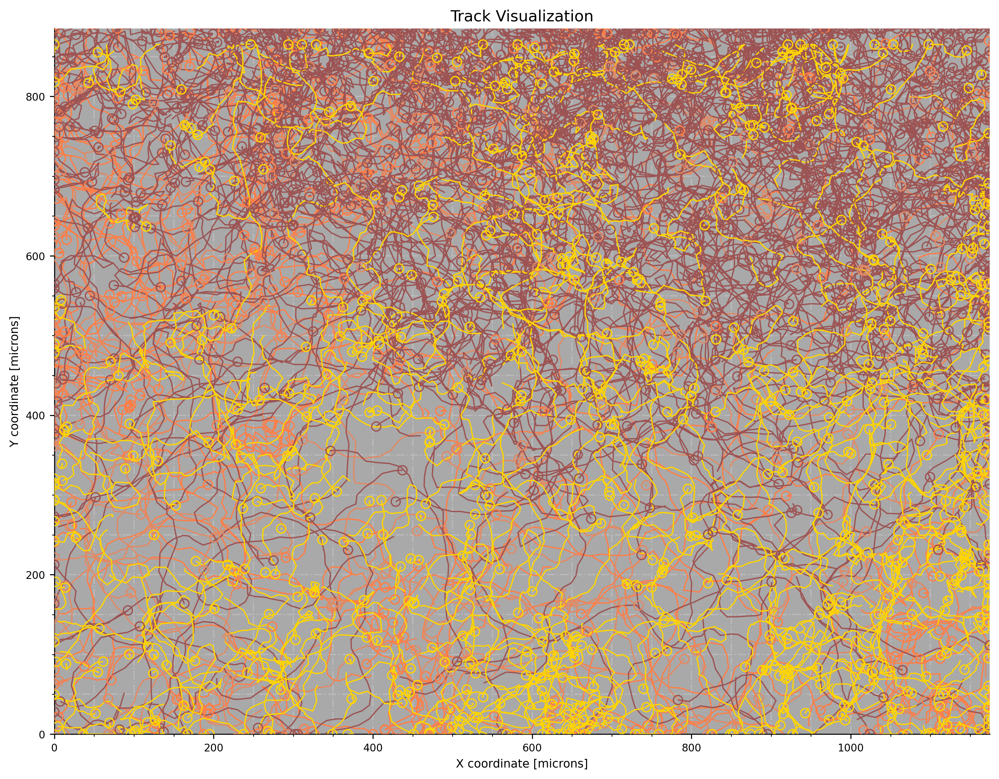

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

def VisualizeTracks(
    Spots_df: pd.DataFrame,
    Tracks_df: pd.DataFrame,
    condition: str,
    *args,
    replicate: str = 'all',
    c_mode: str = 'differentiate replicates',
    only_one_color: str = 'blue',
    lut_scaling_metric: str = 'Track displacement',
    background: str = 'dark',
    smoothing_index: int | float = 0,
    lw: float = 1.0,
    show_tracks: bool = True,
    grid: bool = True,
    markers: bool = False,
    markersize: float = 5.0,
):
    # --- Early outs / guards -------------------------------------------------
    if not show_tracks:
        lw = 0

    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()
    
    # --- Filter & sort once ---------------------------------------------------
    required = ['Condition', 'Replicate', 'Track ID', 'Time point', 'X coordinate', 'Y coordinate', 'Replicate color']
    if any(col not in Spots.columns for col in required):
        return plt.gcf()

    if replicate == 'all':
        Spots = Spots.loc[Spots['Condition'] == condition]
        Tracks = Tracks.loc[Tracks['Condition'] == condition]
    elif replicate != 'all':
        Spots = Spots.loc[Spots['Replicate'] == replicate]
        Tracks = Tracks.loc[Tracks['Replicate'] == replicate]

    Spots = Spots.sort_values(['Condition', 'Replicate', 'Track ID', 'Time point'])
    Tracks = Tracks.sort_values(['Condition', 'Replicate', 'Track ID'])

    # Ensure we can group efficiently
    key_cols = ['Condition', 'Replicate', 'Track ID']

    # Ensure keys exist only as index (no duplicate columns)
    Spots = Spots.set_index(key_cols, drop=True)      # drop=True is the default; keeps keys out of columns
    Tracks = Tracks.set_index(key_cols, drop=True)

    # --- Optional smoothing (vectorized) --------------------------------------
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        Spots['X coordinate'] = (
            Spots.groupby(level=key_cols)['X coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
        )
        Spots['Y coordinate'] = (
            Spots.groupby(level=key_cols)['Y coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
        )

    # --- Colors: compute once, map to each track ------------------------------
    rng = np.random.default_rng(42)

    def rand_color():
        return mcolors.to_hex(rng.random(3))
    def rand_grey():
        g = float(rng.random())
        return mcolors.to_hex((g, g, g))

    colormap = None
    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        # one color per *track*
        unique_tracks = Tracks.index.unique()
        if c_mode == 'random colors':
            colors = [rand_color() for _ in range(len(unique_tracks))]
        elif c_mode == 'random greys':
            colors = [rand_grey() for _ in range(len(unique_tracks))]
        else:
            colors = [only_one_color] * len(unique_tracks)
        track_to_color = dict(zip(unique_tracks, colors))
        Tracks['Track color'] = [track_to_color[idx] for idx in Tracks.index]

    elif c_mode == 'differentiate replicates':
        Tracks['Track color'] = Tracks['Replicate color'] if 'Replicate color' in Tracks.columns else "black"

    else:
        if lut_scaling_metric == "Speed instantaneous":
            # Average instantaneous speed per track
            speed_avg = (
                Spots.groupby(level=key_cols)['Distance']
                     .mean()
                     .rename('Speed mean')
            )
            Tracks = Tracks.join(speed_avg, how='left', on=key_cols, validate='one_to_one')
        else:
            # interpret c_mode as a matplotlib cmap name
            colormap = plt.get_cmap(c_mode)
            vmin = float(Tracks[lut_scaling_metric].min())
            vmax = float(Tracks[lut_scaling_metric].max())
            norm = plt.Normalize(vmin, vmax)
            Tracks['Track color'] = [mcolors.to_hex(colormap(norm(v))) for v in Tracks[lut_scaling_metric].to_numpy()]

    # Map per-track color down to Spots (single join; vectorized)
    # Replace the ambiguous join with this:
    Spots = Spots.join(
        Tracks[['Track color']],
        on=['Condition', 'Replicate', 'Track ID'],
        how='left',
        validate='many_to_one',
    )
    # --- Build line segments for LineCollection -------------------------------
    # Each segment is an array of shape (Ni, 2) for a track
    segments = []
    seg_colors = []
    # Using groupby over MultiIndex is still C-optimized; the loop is per-track (not per-point)
    for (cond, repl, tid), g in Spots.groupby(level=key_cols, sort=False):
        xy = g[['X coordinate', 'Y coordinate']].to_numpy(dtype=float, copy=False)
        if xy.shape[0] >= 2:
            segments.append(xy)
            seg_colors.append(g['Track color'].iloc[0])

    # --- Figure / axes setup ---------------------------------------------------
    if background == 'light':
        grid_color, face_color, grid_alpha, grid_ls = 'gainsboro', 'white', 0.5, '-.' if grid else 'None'
    else:
        grid_color, face_color, grid_alpha, grid_ls = 'silver', 'darkgrey', 0.75, '-.' if grid else 'None'

    fig, ax = plt.subplots(figsize=(13, 10))
    if len(Spots):
        x = Spots['X coordinate'].to_numpy()
        y = Spots['Y coordinate'].to_numpy()
        ax.set_xlim(np.nanmin(x), np.nanmax(x))
        ax.set_ylim(np.nanmin(y), np.nanmax(y))

    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('X coordinate [microns]')
    ax.set_ylabel('Y coordinate [microns]')
    ax.set_title('Track Visualization', fontsize=12)
    ax.set_facecolor(face_color)
    ax.grid(grid, which='both', axis='both', color=grid_color, linestyle=grid_ls, linewidth=1, alpha=grid_alpha)

    # Ticks: use Locators/Formatters instead of setting ticklabels manually
    ax.xaxis.set_major_locator(MultipleLocator(200))
    ax.yaxis.set_major_locator(MultipleLocator(200))
    ax.xaxis.set_minor_locator(MultipleLocator(50))
    ax.yaxis.set_minor_locator(MultipleLocator(50))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.tick_params(axis='both', which='major', labelsize=8)

    # --- Draw all tracks at once ----------------------------------------------
    if segments:
        lc = LineCollection(segments, colors=seg_colors, linewidths=lw if show_tracks else 0, zorder=10)
        ax.add_collection(lc)

    # --- Optional arrows (use quiver in one batch) ----------------------------
    if markers:
        # Plot a marker at the end of each track
        ends = Spots.groupby(level=key_cols, sort=False).tail(1)
        if len(ends):
            xe = ends['X coordinate'].to_numpy(dtype=float, copy=False)
            ye = ends['Y coordinate'].to_numpy(dtype=float, copy=False)
            cols = ends['Track color'].astype(str).to_numpy()
            m = np.isfinite(xe) & np.isfinite(ye)
            if m.any():
                ax.scatter(
                    xe[m],
                    ye[m],
                    marker=markers["symbol"],
                    s=markersize if markersize else 1.0,
                    edgecolor=cols[m],
                    facecolor=cols[m] if markers["fill"] else "none",
                    linewidths=lw,
                    zorder=12,
                )

    # return plt.gcf()
    plt.gcf()
    # plt.show()

VisualizeTracks(
    Spots_df=SPOTS_DATAFRAME, 
    Tracks_df=TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].unique()[0],
    replicate='all',
    c_mode='differentiate replicates',
    markersize=50,
    markers=TracksMarkers['circle-empty'],
    # smoothing_index=5,
)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

def _prepare_tracks_with_colors(Spots_df, Tracks_df, condition, replicate,
                                c_mode, only_one_color, lut_scaling_metric):
    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()

    # filter once
    if replicate == 'all':
        Spots = Spots.loc[Spots['Condition'] == condition]
        Tracks = Tracks.loc[Tracks['Condition'] == condition]
    else:
        Spots = Spots.loc[Spots['Replicate'] == replicate]
        Tracks = Tracks.loc[Tracks['Replicate'] == replicate]

    # sort & index
    key_cols = ['Condition', 'Replicate', 'Track ID']
    Spots = Spots.sort_values(key_cols + ['Frame']).set_index(key_cols)
    Tracks = Tracks.sort_values(key_cols).set_index(key_cols)

    # colors once
    rng = np.random.default_rng(42)

    def rand_color(): return mcolors.to_hex(rng.random(3))
    def rand_grey():
        g = float(rng.random())
        return mcolors.to_hex((g, g, g))

    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        unique_tracks = Tracks.index.unique()
        if c_mode == 'random colors':
            colors = [rand_color() for _ in range(len(unique_tracks))]
        elif c_mode == 'random greys':
            colors = [rand_grey() for _ in range(len(unique_tracks))]
        else:
            colors = [only_one_color] * len(unique_tracks)
        track_to_color = dict(zip(unique_tracks, colors))
        Tracks['Track color'] = [track_to_color[idx] for idx in Tracks.index]
    elif c_mode == 'differentiate replicates':
        Tracks['Track color'] = Tracks['Replicate color'] if 'Replicate color' in Tracks.columns else "black"
    else:
        colormap = plt.get_cmap(c_mode)
        vmin = float(Tracks[lut_scaling_metric].min())
        vmax = float(Tracks[lut_scaling_metric].max())
        norm = plt.Normalize(vmin, vmax)
        Tracks['Track color'] = [mcolors.to_hex(colormap(norm(v))) for v in Tracks[lut_scaling_metric].to_numpy()]

    # single join to propagate per-track color to spots
    Spots = Spots.join(
        Tracks[['Track color']],
        on=Tracks.index.names,
        how='left',
        validate='many_to_one',
    )
    return Spots, Tracks

def _segments_for_frame(Spots_idxed, frame_value, key_cols=('Condition','Replicate','Track ID')):
    """Build segments up to and including `frame_value` in one pass."""
    segs, cols = [], []
    # Select only needed rows (fast boolean mask on a column)
    sub = Spots_idxed[Spots_idxed['Frame'] <= frame_value]

    # Group by track; each becomes one polyline up to that frame
    for _, g in sub.groupby(level=key_cols, sort=False):
        xy = g[['X coordinate','Y coordinate']].to_numpy(dtype=float, copy=False)
        if xy.shape[0] >= 2:
            segs.append(xy)
            cols.append(g['Track color'].iloc[0])
    return segs, cols

def visualize_tracks_frame(
    Spots_df: pd.DataFrame,
    Tracks_df: pd.DataFrame,
    condition: str,
    *,
    replicate: str = 'all',
    c_mode: str = 'differentiate replicates',
    only_one_color: str = 'blue',
    lut_scaling_metric: str = 'Track displacement',
    background: str = 'dark',
    smoothing_index: int | float = 0,
    lw: float = 1.0,
    show_tracks: bool = True,
    grid: bool = True,
    frame_value: int = 0,
):
    if not show_tracks:
        lw = 0

    required = ['Condition','Replicate','Track ID','Frame','X coordinate','Y coordinate','Replicate color']
    if any(col not in Spots_df.columns for col in required if col!='Replicate color'):
        return plt.gcf()

    Spots, Tracks = _prepare_tracks_with_colors(
        Spots_df, Tracks_df, condition, replicate, c_mode, only_one_color, lut_scaling_metric
    )

    # Optional smoothing (vectorized; done once on the working table)
    if isinstance(smoothing_index, (int,float)) and smoothing_index > 1:
        win = int(smoothing_index)
        idx_names = ['Condition','Replicate','Track ID']
        Spots['X coordinate'] = Spots.groupby(level=idx_names)['X coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
        Spots['Y coordinate'] = Spots.groupby(level=idx_names)['Y coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())

    segs, cols = _segments_for_frame(Spots, frame_value)

    # Figure/axes setup (cheap; we keep it minimal)
    if background == 'light':
        grid_color, face_color, grid_alpha, grid_ls = 'gainsboro', 'white', 0.5, '-.' if grid else 'None'
    else:
        grid_color, face_color, grid_alpha, grid_ls = 'silver', 'darkgrey', 0.75, '-.' if grid else 'None'

    fig, ax = plt.subplots(figsize=(13, 10))
    # Axis limits stable: compute once from *all* spots (gives no zoom jump)
    x = Spots_df.loc[Spots_df['Condition'] == condition, 'X coordinate'].to_numpy()
    y = Spots_df.loc[Spots_df['Condition'] == condition, 'Y coordinate'].to_numpy()
    if len(x) and len(y):
        ax.set_xlim(np.nanmin(x), np.nanmax(x))
        ax.set_ylim(np.nanmin(y), np.nanmax(y))

    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('X coordinate [microns]')
    ax.set_ylabel('Y coordinate [microns]')
    ax.set_title(f'Track Visualization — Frame {frame_value}', fontsize=12)
    ax.set_facecolor(face_color)
    ax.grid(grid, which='both', axis='both', color=grid_color, linestyle=grid_ls, linewidth=1, alpha=grid_alpha)

    ax.xaxis.set_major_locator(MultipleLocator(200))
    ax.yaxis.set_major_locator(MultipleLocator(200))
    ax.xaxis.set_minor_locator(MultipleLocator(50))
    ax.yaxis.set_minor_locator(MultipleLocator(50))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.tick_params(axis='both', which='major', labelsize=8)

    if segs:
        lc = LineCollection(segs, colors=cols, linewidths=lw if show_tracks else 0, zorder=10)
        ax.add_collection(lc)

    return fig


In [ ]:
from shiny import App, ui, render, reactive

# Suppose you already have Spots_df, Tracks_df in memory.
# IMPORTANT: Ensure there is a 'Frame' column (int) in Spots_df.

def make_app(Spots_df: pd.DataFrame, Tracks_df: pd.DataFrame, default_condition: str):
    # establish frame range for the chosen condition (once)
    cond_mask = Spots_df['Condition'] == default_condition
    frame_min_val = Spots_df.loc[cond_mask, 'Frame'].min()
    frame_max_val = Spots_df.loc[cond_mask, 'Frame'].max()
    # Handle NaN gracefully
    frame_min = int(frame_min_val) if pd.notnull(frame_min_val) else 0
    frame_max = int(frame_max_val) if pd.notnull(frame_max_val) else 1

    app_ui = ui.page_sidebar(
        ui.sidebar(
            ui.input_slider("frame", "Frame", min=frame_min, max=frame_max, value=frame_min, step=1, ticks=False),
            ui.hr(),
            ui.input_select("replicate", "Replicate", choices=["all"] + sorted(Spots_df.loc[cond_mask, 'Replicate'].unique())),
            ui.input_select("c_mode", "Color mode", choices=[
                "differentiate replicates", "random colors", "random greys", "only-one-color", "viridis", "plasma", "magma"
            ], selected="differentiate replicates"),
            ui.input_text("only_one_color", "Only-one-color (hex or name)", value="blue"),
            ui.input_numeric("smooth", "Smoothing window", 0),
            ui.input_checkbox("grid", "Grid", True),
            width=300
        ),
        ui.card(
            ui.card_header("Visualize Tracks (scrub the frame slider)"),
            ui.output_plot("tracks_plot", fill=True, height="650px"),
        ),
        title="Frame-synchronized Track Viewer"
    )

    def server(input, output, session):

        @reactive.calc
        def opts():
            # package current settings
            return dict(
                replicate=input.replicate(),
                c_mode=input.c_mode(),
                only_one_color=input.only_one_color(),
                smoothing_index=input.smooth(),
                grid=input.grid(),
            )

        @render.plot
        def tracks_plot():
            o = opts()
            fig = visualize_tracks_frame(
                Spots_df=Spots_df,
                Tracks_df=Tracks_df,
                condition=default_condition,
                replicate=o["replicate"],
                c_mode=o["c_mode"],
                only_one_color=o["only_one_color"],
                background='dark',
                lut_scaling_metric='Track displacement',
                smoothing_index=o["smoothing_index"],
                lw=1.0,
                show_tracks=True,
                grid=o["grid"],
                frame_value=input.frame(),
            )
            return fig

    return App(app_ui, server)

app = make_app(
    Spots_df=SPOTS_DATAFRAME,
    Tracks_df=TRACKS_DATAFRAME,
    default_condition=TRACKS_DATAFRAME['Condition'].unique()[0]
)
app  # In Jupyter, just display the app object

C:\Users\modri\AppData\Local\Temp\ipykernel_17772\585399597.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_row['Condition'] = cond
C:\Users\modri\AppData\Local\Temp\ipykernel_17772\585399597.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_row['Condition'] = cond
C:\Users\modri\AppData\Local\Temp\ipykernel_17772\585399597.py:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_row['Replicate'] = repl
C:\User

KeyboardInterrupt: 

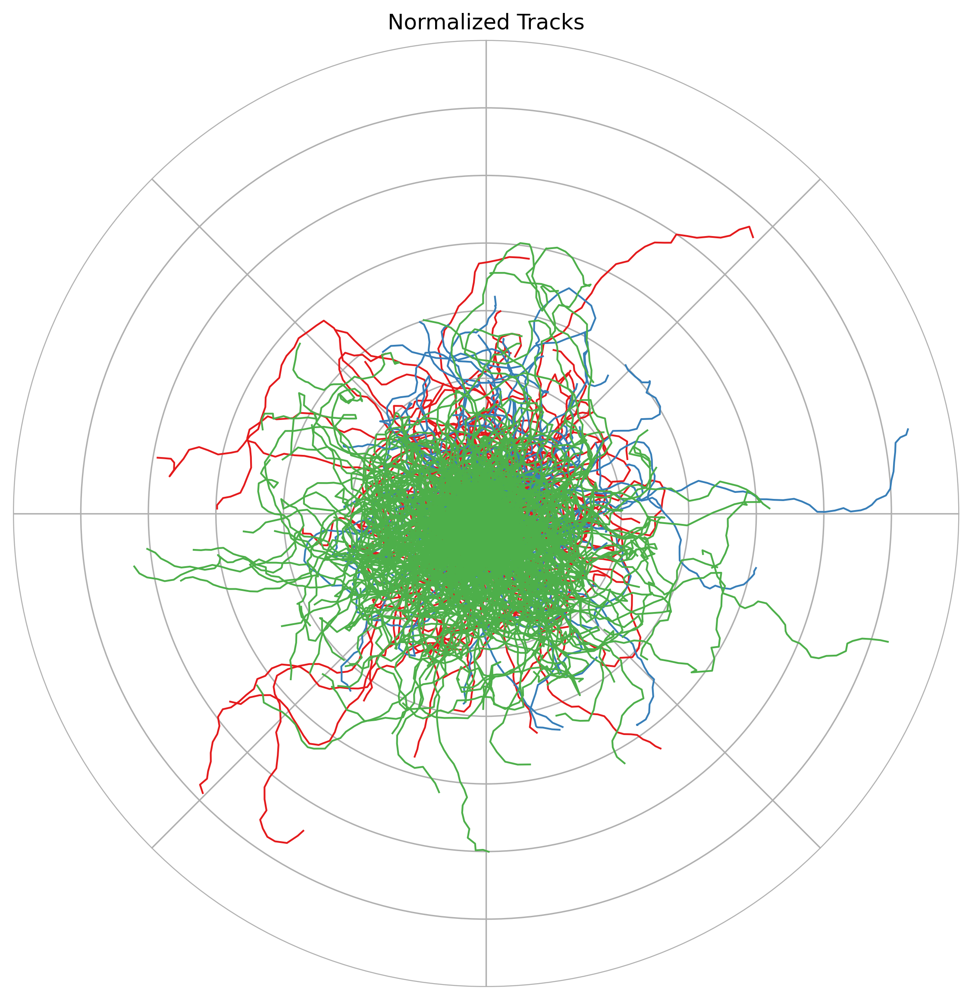

In [ ]:
def Visualize_normalized_tracks_matplotlib(
        Spots_df: pd.DataFrame, 
        Tracks_df: pd.DataFrame, 
        condition: str, 
        *args,
        replicate: str = 'all', 
        c_mode: str = 'differentiate replicates', 
        only_one_color: str = 'blue', 
        lut_scaling_metric: str = 'Track displacement', 
        smoothing_index: float = 0, 
        lw: float = 1.0, 
        show_tracks: bool = True, 
        grid: bool = True, 
        arrows: bool = False, 
        arrowsize: int = 5
    ):

    arrow_length = 1  # Length of the arrow in data units

    # if 'level_0' in Tracks_df.columns:
    #     Tracks_df.drop(columns=['level_0'], inplace=True)
    
    # Tracks_df.reset_index(drop=False, inplace=True)


    sort_cols = ['Condition', 'Replicate', 'Track ID', 'Time point']
    missing_cols = [col for col in sort_cols if col not in Spots_df.columns]
    if not missing_cols:
        if condition == 'all':
            Spots_df = Spots_df.sort_values(by=sort_cols)
        elif condition != 'all' and replicate == 'all':
            Spots_df = Spots_df[Spots_df['Condition'] == condition].sort_values(by=sort_cols)
        elif condition != 'all' and replicate != 'all':
            Spots_df = Spots_df[(Spots_df['Condition'] == condition) & (Spots_df['Replicate'] == replicate)].sort_values(by=sort_cols)
    # else: skip sorting if columns are missing
    
    np.random.seed(42)  # For reproducibility
    
    # Set colors based on chosen mode
    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        colormap = None
        if c_mode == 'random colors':
            track_colors = [_generate_random_color() for _ in range(len(Tracks_df))]
        elif c_mode == 'random greys':
            track_colors = [_generate_random_grey() for _ in range(len(Tracks_df))]
        else:
            track_colors = [only_one_color for _ in range(len(Tracks_df))]
        
        color_map_direct = dict(zip(Tracks_df['Track ID'], track_colors))
        Tracks_df['Color'] = Tracks_df['Track ID'].map(color_map_direct)

    elif c_mode in ['differentiate conditions', 'differentiate replicates']:
        if c_mode == 'differentiate conditions':
            colormap = plt.get_cmap('Set1')  # Use qualitative colormap
            unique_vals = Spots_df['Condition'].unique()
            val_column = 'Condition'
        else:
            colormap = plt.get_cmap('Set1')
            unique_vals = Spots_df['Replicate'].unique()
            val_column = 'Replicate'

        # Assign colors to each unique category
        val_to_color = {
            val: colormap(i % colormap.N)  # Wrap around if more values than colors
            for i, val in enumerate(sorted(unique_vals))
        }
        # Map those colors to the tracks
        Tracks_df['Color'] = Tracks_df[val_column].map(val_to_color)

    else:
        colormap = _get_cmap(c_mode)
        metric_min = Spots_df[lut_scaling_metric].min()
        metric_max = Spots_df[lut_scaling_metric].max()


    Spots_grouped = Spots_df.groupby(['Condition', 'Replicate', 'Track ID'])
    Tracks_df.set_index(['Condition', 'Replicate', 'Track ID'], inplace=True)
    
    processed_groups = []

    # Normalize each track's positions to start at (0, 0)
    for (cond, repl, track), group_df in Spots_grouped:
        # Apply smoothing if required
        if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
            group_df['X coordinate'] = group_df['X coordinate'].rolling(window=int(smoothing_index), min_periods=1).mean()
            group_df['Y coordinate'] = group_df['Y coordinate'].rolling(window=int(smoothing_index), min_periods=1).mean()

        # Normalize positions to start at (0, 0)
        start_x = group_df['X coordinate'].iloc[0]
        start_y = group_df['Y coordinate'].iloc[0]

        group_df['X coordinate'] -= start_x
        group_df['Y coordinate'] -= start_y

        processed_groups.append(group_df)

    # Concatenate everything back into one DataFrame
    Spots_df = pd.concat(processed_groups)

    # Convert to polar coordinates.
    Spots_df['r'] = np.sqrt(Spots_df['X coordinate']**2 + Spots_df['Y coordinate']**2)
    Spots_df['theta'] = np.arctan2(Spots_df['Y coordinate'], Spots_df['X coordinate'])

    Spots_grouped = Spots_df.groupby(['Condition', 'Replicate', 'Track ID'])
    
    fig, ax = plt.subplots(figsize=(12.5, 9.5), subplot_kw={'projection': 'polar'})
    y_max = Spots_df['r'].max() * 1.1

    x_grid_color = 'grey'
    y_grid_color = 'lightgrey'
    ax.set_facecolor('white')

    ax.set_title('Normalized Tracks')
    ax.set_ylim(0, y_max)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.spines['polar'].set_visible(False)
    ax.grid(grid)
    

    # Plot all tracks along with an arrow at the track's end pointing toward the mean direction
    for (cond, repl, track), group_df in Spots_grouped:

        track_row = Tracks_df.loc[(cond, repl, track)]
        track_row['Condition'] = cond
        track_row['Replicate'] = repl
        track_row['Track ID'] = track

        if colormap is not None and c_mode in ['differentiate conditions', 'differentiate replicates']:
            key = track_row[val_column]  # val_column is either 'Condition' or 'Replicate'
            color = colormap(unique_vals.tolist().index(key) % colormap.N)  # consistent mapping
            group_df['Color'] = mcolors.to_hex(color)
            
        elif colormap is not None:
            # This is for metric-based color mapping (quantitative)
            norm = plt.Normalize(metric_min, metric_max)
            color = colormap(norm(track_row[lut_scaling_metric]))
            group_df['Color'] = mcolors.to_hex(color)
            
        elif c_mode in ['random colors', 'random greys']:
            group_df['Color'] = track_row['Color']

        elif c_mode == 'only-one-color':
            group_df['Color'] = only_one_color


        # Plot the track using computed color.
        ax.plot(group_df['theta'], group_df['r'], lw=lw, color=group_df['Color'].iloc[0])

        # If arrows flag is True, add an arrow at the end of the track.
        if arrows:
            # Get the last point of the current track.
            last_point = group_df.iloc[-1]
            r_end = last_point['r']
            theta_end = last_point['theta']

            # Get the mean direction from the track metadata (in radians)
            mean_dir = track_row['Direction mean (rad)']

            # Convert last point from polar to Cartesian coordinates.
            x_end = r_end * np.cos(theta_end)
            y_end = r_end * np.sin(theta_end)
            
            # Calculate the arrow tip in Cartesian coordinates using the mean direction.
            x_tip = x_end + arrow_length * np.cos(mean_dir)
            y_tip = y_end + arrow_length * np.sin(mean_dir)
            
            # Convert the computed Cartesian arrow tip back to polar coordinates.
            r_tip = np.sqrt(x_tip**2 + y_tip**2)
            theta_tip = np.arctan2(y_tip, x_tip)

            ax.annotate(
                '',
                xy=(theta_tip, r_tip),
                xytext=(theta_end, r_end),
                arrowprops=dict(arrowstyle='-|>', 
                color=group_df['Color'].iloc[0], 
                lw=lw if show_tracks else 0, 
                mutation_scale=arrowsize),
                annotation_clip=False
            )

    Tracks_df.reset_index(drop=False, inplace=True)

    # Style the polar grid.
    for i, line in enumerate(ax.get_xgridlines()):
        if i % 2 == 0:
            line.set_linestyle('--')
            line.set_color(x_grid_color)
            line.set_linewidth(0.5)

    for line in ax.get_ygridlines():
        line.set_linestyle('-.')
        line.set_color(y_grid_color)
        line.set_linewidth(0.5)

    return plt.gcf()

Visualize_normalized_tracks_matplotlib(
    Spots_df=SPOTS_DATAFRAME,
    Tracks_df=TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].unique()[0],
)



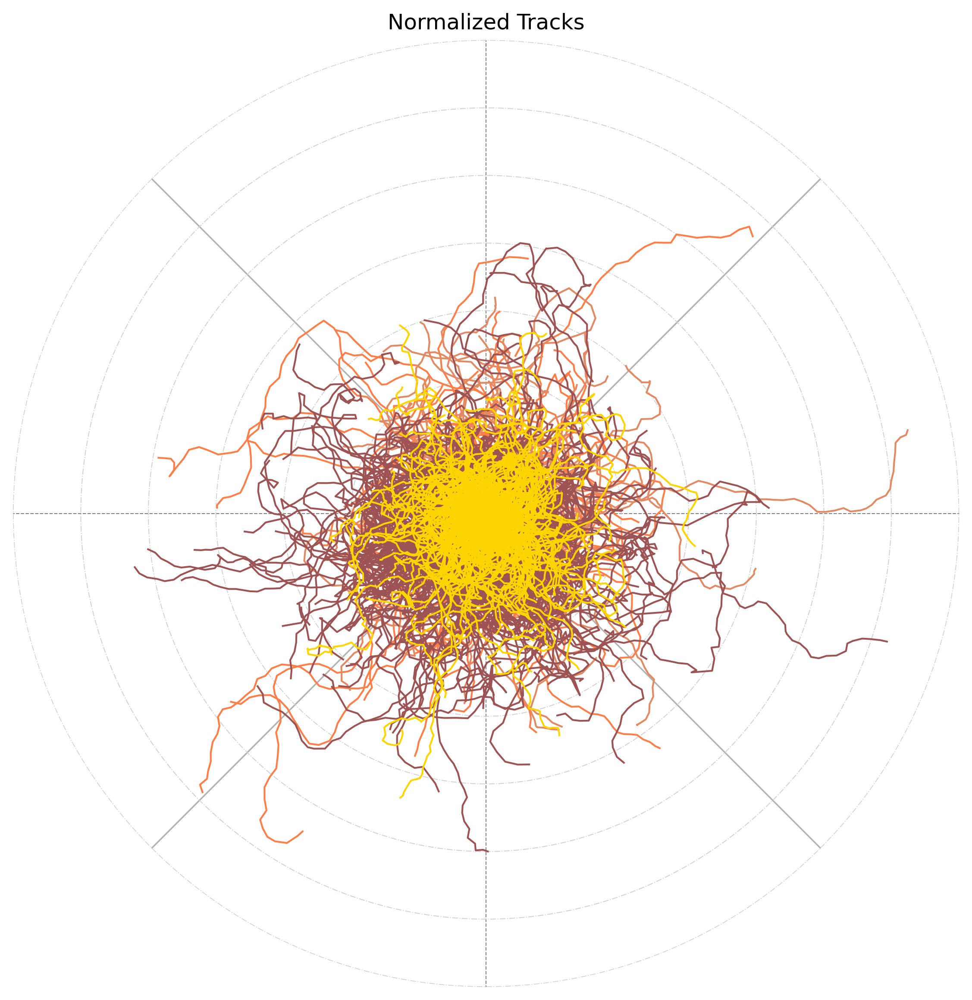

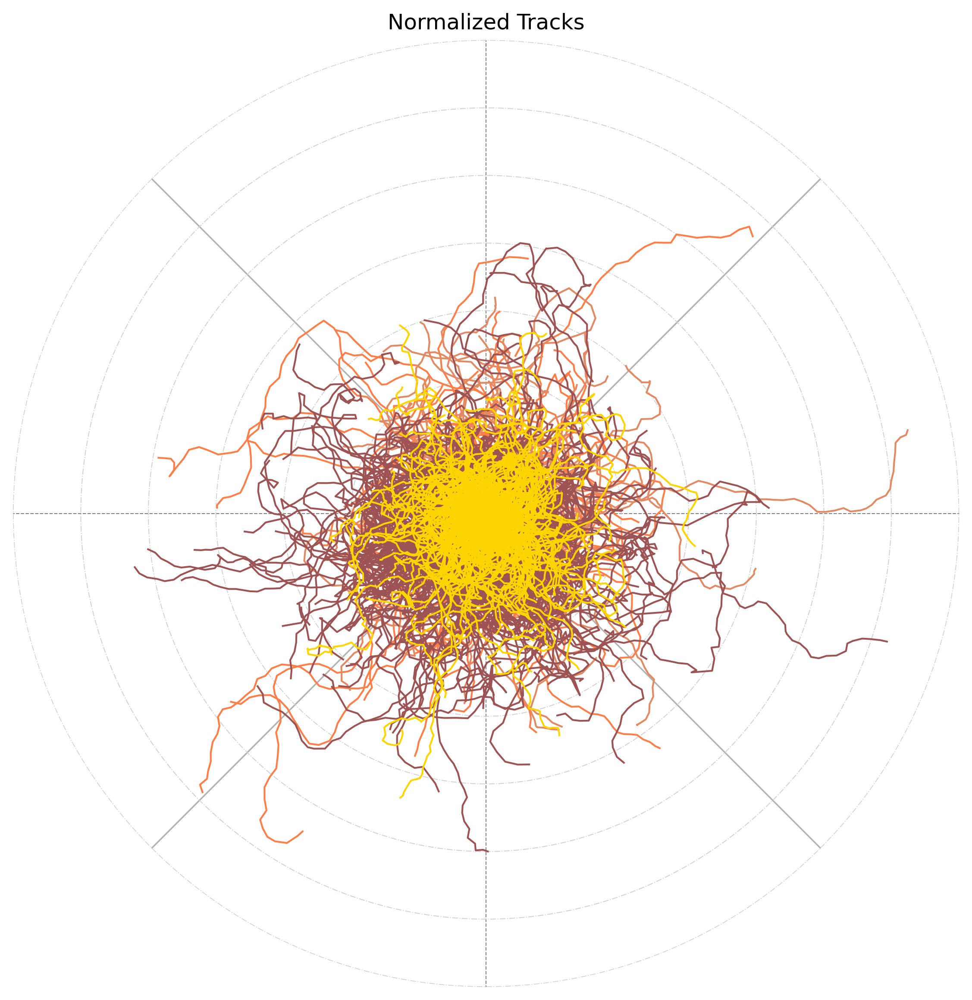

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

def _rand_hex_colors(n, rng):
    return [mcolors.to_hex(rng.random(3)) for _ in range(n)]

def _rand_hex_greys(n, rng):
    greys = rng.random(n)
    return [mcolors.to_hex((float(g), float(g), float(g))) for g in greys]

def Visualize_normalized_tracks_matplotlib(
    Spots_df: pd.DataFrame,
    Tracks_df: pd.DataFrame,
    condition: str,
    *args,
    replicate: str = 'all',
    c_mode: str = 'differentiate replicates',
    only_one_color: str = 'blue',
    lut_scaling_metric: str = 'Track displacement',
    smoothing_index: float = 0,
    lw: float = 1.0,
    show_tracks: bool = True,
    grid: bool = True,
    arrows: bool = False,
    arrowsize: int = 5,
):
    """
    Fast, vectorized normalized (origin-shifted) polar track visualization.
    Mirrors VisualizeTracks logic:
      - single sort + groupby over MultiIndex
      - vectorized smoothing and normalization
      - consistent color-mapping, incl. 'differentiate replicates'
      - one-pass LineCollection draw in polar space
      - optional arrows (mean direction) drawn efficiently
    """

    

    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()

    # Required columns
    required_spots = ['Condition','Replicate','Track ID','Time point','X coordinate','Y coordinate']
    if any(col not in Spots.columns for col in required_spots):
        return plt.gcf()

    # --- Filter & sort once --------------------------------------------------
    if condition == 'all':
        if replicate != 'all':
            Spots = Spots.loc[Spots['Replicate'] == replicate]
            Tracks = Tracks.loc[Tracks['Replicate'] == replicate]
    else:
        Spots = Spots.loc[Spots['Condition'] == condition]
        Tracks = Tracks.loc[Tracks['Condition'] == condition]
        if replicate != 'all':
            Spots = Spots.loc[Spots['Replicate'] == replicate]
            Tracks = Tracks.loc[Tracks['Replicate'] == replicate]

    Spots = Spots.sort_values(['Condition','Replicate','Track ID','Time point'])
    Tracks = Tracks.sort_values(['Condition','Replicate','Track ID'])

    key_cols = ['Condition','Replicate','Track ID']

    # Index for efficient groupby/joins
    Spots = Spots.set_index(key_cols, drop=True)
    Tracks = Tracks.set_index(key_cols, drop=True)

    # --- Optional smoothing (vectorized over groups) -------------------------
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        Spots['X coordinate'] = Spots.groupby(level=key_cols)['X coordinate'] \
                                     .transform(lambda s: s.rolling(win, min_periods=1).mean())
        Spots['Y coordinate'] = Spots.groupby(level=key_cols)['Y coordinate'] \
                                     .transform(lambda s: s.rolling(win, min_periods=1).mean())

    # --- Normalize each track to start at (0,0) (vectorized) -----------------
    x0 = Spots.groupby(level=key_cols)['X coordinate'].transform('first')
    y0 = Spots.groupby(level=key_cols)['Y coordinate'].transform('first')
    Spots['Xn'] = Spots['X coordinate'] - x0
    Spots['Yn'] = Spots['Y coordinate'] - y0

    # --- Colors: compute once on Tracks, map to Spots ------------------------
    rng = np.random.default_rng(42)
    track_index = Tracks.index.unique()

    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        if c_mode == 'random colors':
            cols = _rand_hex_colors(len(track_index), rng)
        elif c_mode == 'random greys':
            cols = _rand_hex_greys(len(track_index), rng)
        else:
            cols = [mcolors.to_hex(only_one_color)] * len(track_index)
        color_map = dict(zip(track_index, cols))
        Tracks['Track color'] = [color_map[idx] for idx in Tracks.index]

    elif c_mode == 'differentiate replicates':
        # Use 'Replicate color' from Tracks when available; otherwise fallback to a stable random per replicate
        if 'Replicate color' in Tracks.columns:
            Tracks['Track color'] = Tracks['Replicate color'].astype(str)
        else:
            reps = Tracks.reset_index()['Replicate'].unique().tolist()
            rep_cols = _rand_hex_colors(len(reps), rng)
            rep2col = dict(zip(reps, rep_cols))
            Tracks = Tracks.reset_index()
            Tracks['Track color'] = Tracks['Replicate'].map(rep2col)
            Tracks = Tracks.set_index(key_cols)

    elif c_mode == 'differentiate conditions':
        conds = Tracks.reset_index()['Condition'].unique().tolist()
        cmap = plt.get_cmap('Set1')
        cond2col = {c: mcolors.to_hex(cmap(i % cmap.N)) for i, c in enumerate(sorted(conds))}
        Tracks = Tracks.reset_index()
        Tracks['Track color'] = Tracks['Condition'].map(cond2col)
        Tracks = Tracks.set_index(key_cols)

    else:
        # Interpret c_mode as a Matplotlib colormap for quantitative mapping on Tracks
        cmap = plt.get_cmap(c_mode)
        vmin = float(Tracks[lut_scaling_metric].min()) if lut_scaling_metric in Tracks.columns else 0.0
        vmax = float(Tracks[lut_scaling_metric].max()) if lut_scaling_metric in Tracks.columns else 1.0
        norm = plt.Normalize(vmin, vmax)
        vals = Tracks[lut_scaling_metric].to_numpy() if lut_scaling_metric in Tracks.columns else np.zeros(len(Tracks))
        Tracks['Track color'] = [mcolors.to_hex(cmap(norm(v))) for v in vals]

    # Map per-track color to Spots (many-to-one join)
    Spots = Spots.join(
        Tracks[['Track color']],
        on=key_cols,
        how='left',
        validate='many_to_one',
    )

    # --- Polar conversion (vectorized) ---------------------------------------
    Spots['r'] = np.sqrt(Spots['Xn']**2 + Spots['Yn']**2)
    Spots['theta'] = np.arctan2(Spots['Yn'], Spots['Xn'])

    # --- Build segments per track for LineCollection in polar ----------------
    segments = []
    seg_colors = []
    for (cond, repl, tid), g in Spots.groupby(level=key_cols, sort=False):
        # Assumes sorted by time already
        th = g['theta'].to_numpy(dtype=float, copy=False)
        rr = g['r'].to_numpy(dtype=float, copy=False)
        if th.size >= 2:
            # Nx2 path in polar coordinates: (theta, r)
            seg = np.column_stack([th, rr])
            segments.append(seg)
            seg_colors.append(g['Track color'].iloc[0])

    # --- Figure / axes setup --------------------------------------------------
    fig, ax = plt.subplots(figsize=(12.5, 9.5), subplot_kw={'projection': 'polar'})

    if len(Spots):
        y_max = float(np.nanmax(Spots['r'].to_numpy())) * 1.1
        if not np.isfinite(y_max) or y_max <= 0:
            y_max = 1.0
    else:
        y_max = 1.0

    ax.set_facecolor('white')
    ax.set_title('Normalized Tracks', fontsize=12)
    ax.set_ylim(0, y_max)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.spines['polar'].set_visible(False)
    ax.grid(grid)

    # --- Draw all tracks at once ---------------------------------------------
    if segments:
        lc = LineCollection(
            segments,
            colors=seg_colors,
            linewidths=lw if show_tracks else 0,
            zorder=10,
        )
        # VERY IMPORTANT: tell LC these are in data coords of the polar Axes
        lc.set_transform(ax.transData)
        ax.add_collection(lc)

    # --- Optional arrows (toward mean direction) -----------------------------
    if arrows and 'Direction mean (rad)' in Tracks.columns:
        # One arrow per track, using the last point as tail; tip = tail + arrow_length * mean_dir
        arrow_length = 1.0
        # Grab last point per track from Spots and mean dir from Tracks
        last_pts = Spots.groupby(level=key_cols, sort=False).tail(1).reset_index()
        mean_dir = Tracks.reset_index()[key_cols + ['Direction mean (rad)','Track color']]

        merged = pd.merge(last_pts, mean_dir, on=key_cols, how='left', validate='one_to_one')

        # Compute tip in Cartesian, then convert to polar
        xe = merged['Xn'].to_numpy()
        ye = merged['Yn'].to_numpy()
        md = merged['Direction mean (rad)'].to_numpy()
        cols = merged['Track color'].astype(str).to_numpy()

        xt = xe + arrow_length * np.cos(md)
        yt = ye + arrow_length * np.sin(md)

        tail_r = np.sqrt(xe**2 + ye**2)
        tail_th = np.arctan2(ye, xe)
        tip_r = np.sqrt(xt**2 + yt**2)
        tip_th = np.arctan2(yt, xt)

        # Draw in color chunks to minimize draw calls
        if tail_r.size:
            uniq_cols = np.unique(cols)
            for col in uniq_cols:
                m = (cols == col)
                for th0, r0, th1, r1 in zip(tail_th[m], tail_r[m], tip_th[m], tip_r[m]):
                    ax.annotate(
                        '',
                        xy=(th1, r1),
                        xytext=(th0, r0),
                        arrowprops=dict(
                            arrowstyle='-|>',
                            color=str(col),
                            lw=lw if show_tracks else 0,
                            mutation_scale=arrowsize,
                        ),
                        annotation_clip=False,
                    )

    # --- Style the polar grid (subtle alternating styles) --------------------
    for i, line in enumerate(ax.get_xgridlines()):
        if i % 2 == 0:
            line.set_linestyle('--')
            line.set_color('grey')
            line.set_linewidth(0.5)
    for line in ax.get_ygridlines():
        line.set_linestyle('-.')
        line.set_color('lightgrey')
        line.set_linewidth(0.5)

    return plt.gcf()

Visualize_normalized_tracks_matplotlib(
    Spots_df=SPOTS_DATAFRAME,
    Tracks_df=TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].unique()[0],
)

In [ ]:
print(TRACKS_DATAFRAME['Track displacement'].max())

668.1432143204958


In [ ]:
def Lut_map(Tracks_df:pd.DataFrame, Spots_df:pd.DataFrame, c_mode:str, lut_scaling_metric:str):

    if c_mode not in ['random colors', 'random greys', 'only-one-color', 'diferentiate replicates']:

        if lut_scaling_metric != 'Speed instantaneous':
            lut_norm_df = Tracks_df[[lut_scaling_metric]].drop_duplicates()
            _lut_scaling_metric = lut_scaling_metric
        if lut_scaling_metric == 'Speed instantaneous':
            lut_norm_df = Spots_df[['Distance']].drop_duplicates()
            _lut_scaling_metric = 'Distance'

        # Normalize the Net distance to a 0-1 range
        lut_min = lut_norm_df[_lut_scaling_metric].min()
        lut_max = lut_norm_df[_lut_scaling_metric].max()
        norm = plt.Normalize(vmin=lut_min, vmax=lut_max)

        # Get the colormap based on the selected mode
        colormap = _get_cmap(c_mode)
    
        # Add a colorbar to show the LUT map
        sm = plt.cm.ScalarMappable(norm=norm, cmap=colormap)
        sm.set_array([])
        # Create a separate figure for the LUT map (colorbar)
        fig_lut, ax_lut = plt.subplots(figsize=(2, 6))
        ax_lut.axis('off')
        cbar = fig_lut.colorbar(sm, ax=ax_lut, orientation='vertical', extend='both')
        cbar.set_label(lut_scaling_metric, fontsize=10)

        plt.gcf()

    else:
        pass

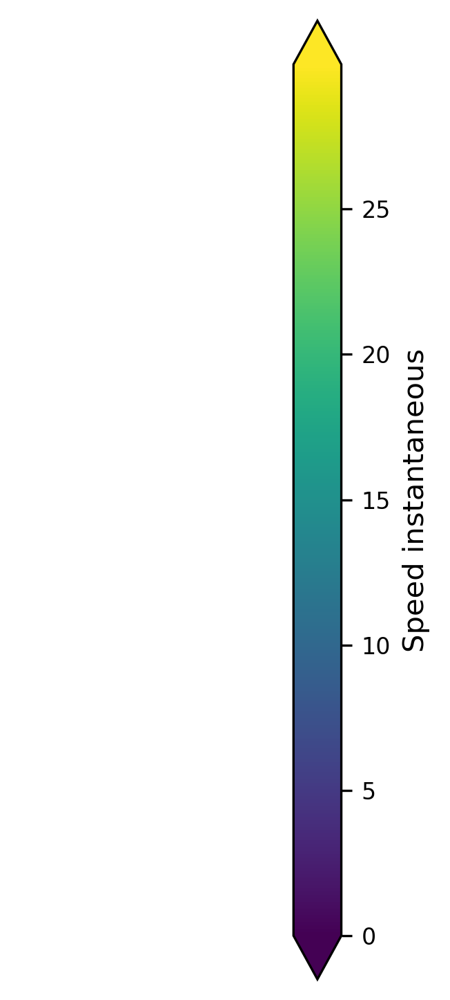

In [ ]:
Lut_map(
    Tracks_df=TRACKS_DATAFRAME,
    Spots_df=SPOTS_DATAFRAME,
    c_mode='viridis',
    lut_scaling_metric='Speed instantaneous'
)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors

def _rand_hex_colors(n, rng):
    return [mcolors.to_hex(rng.random(3)) for _ in range(n)]

def _rand_hex_greys(n, rng):
    greys = rng.random(n)
    return [mcolors.to_hex((float(g), float(g), float(g))) for g in greys]

def Visualize_normalized_tracks_matplotlib(
    Spots_df: pd.DataFrame,
    Tracks_df: pd.DataFrame,
    condition: str,
    *args,
    replicate: str = 'all',
    c_mode: str = 'differentiate replicates',
    only_one_color: str = 'blue',
    lut_scaling_metric: str = 'Track displacement',
    smoothing_index: float = 0,
    lw: float = 1.0,
    show_tracks: bool = True,
    grid: bool = True,
    arrows: bool = False,
    arrowsize: int = 5,
):
    # ----------------- copies / guards -----------------
    Spots_all = Spots_df.copy()
    Spots = Spots_df.copy()
    Tracks = Tracks_df.copy()

    required_spots = ['Condition','Replicate','Track ID','Time point','X coordinate','Y coordinate']
    if any(col not in Spots.columns for col in required_spots):
        return plt.gcf()

    # ----------------- filter subset to draw -----------------
    if condition == 'all':
        if replicate != 'all':
            Spots = Spots.loc[Spots['Replicate'] == replicate]
            Tracks = Tracks.loc[Tracks['Replicate'] == replicate]
    else:
        Spots = Spots.loc[Spots['Condition'] == condition]
        Tracks = Tracks.loc[Tracks['Condition'] == condition]
        if replicate != 'all':
            Spots = Spots.loc[Spots['Replicate'] == replicate]
            Tracks = Tracks.loc[Tracks['Replicate'] == replicate]

    sort_cols = ['Condition','Replicate','Track ID','Time point']
    key_cols = ['Condition','Replicate','Track ID']
    Spots = Spots.sort_values(sort_cols).set_index(key_cols, drop=True)
    Tracks = Tracks.sort_values(['Condition','Replicate','Track ID']).set_index(key_cols, drop=True)

    # ----------------- smoothing (subset) -----------------
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        Spots['X coordinate'] = Spots.groupby(level=key_cols)['X coordinate'] \
            .transform(lambda s: s.rolling(win, min_periods=1).mean())
        Spots['Y coordinate'] = Spots.groupby(level=key_cols)['Y coordinate'] \
            .transform(lambda s: s.rolling(win, min_periods=1).mean())

    # ----------------- normalize (subset) -----------------
    x0 = Spots.groupby(level=key_cols)['X coordinate'].transform('first')
    y0 = Spots.groupby(level=key_cols)['Y coordinate'].transform('first')
    Spots['Xn'] = Spots['X coordinate'] - x0
    Spots['Yn'] = Spots['Y coordinate'] - y0

    # ----------------- colors on Tracks, join to Spots -----------------
    rng = np.random.default_rng(42)
    track_index = Tracks.index.unique()

    if c_mode in ['random colors', 'random greys', 'only-one-color']:
        if c_mode == 'random colors':
            cols = _rand_hex_colors(len(track_index), rng)
        elif c_mode == 'random greys':
            cols = _rand_hex_greys(len(track_index), rng)
        else:
            cols = [mcolors.to_hex(only_one_color)] * len(track_index)
        Tracks['Track color'] = [dict(zip(track_index, cols))[idx] for idx in Tracks.index]

    elif c_mode == 'differentiate replicates':
        if 'Replicate color' in Tracks.columns:
            Tracks['Track color'] = Tracks['Replicate color'].astype(str)
        else:
            reps = Tracks.reset_index()['Replicate'].unique().tolist()
            rep_cols = _rand_hex_colors(len(reps), rng)
            rep2col = dict(zip(reps, rep_cols))
            Tracks = Tracks.reset_index()
            Tracks['Track color'] = Tracks['Replicate'].map(rep2col)
            Tracks = Tracks.set_index(key_cols)

    else:
        cmap = _get_cmap(c_mode)
        vmin = float(Tracks[lut_scaling_metric].min()) if lut_scaling_metric in Tracks.columns else 0.0
        vmax = float(Tracks[lut_scaling_metric].max()) if lut_scaling_metric in Tracks.columns else 1.0
        norm = plt.Normalize(vmin, vmax)
        vals = Tracks[lut_scaling_metric].to_numpy() if lut_scaling_metric in Tracks.columns else np.zeros(len(Tracks))
        Tracks['Track color'] = [mcolors.to_hex(cmap(norm(v))) for v in vals]

    Spots = Spots.join(Tracks[['Track color']], on=key_cols, how='left', validate='many_to_one')

    # ----------------- polar conversion (subset) -----------------
    Spots['r'] = np.sqrt(Spots['Xn']**2 + Spots['Yn']**2)
    Spots['theta'] = np.arctan2(Spots['Yn'], Spots['Xn'])

    # ----------------- GLOBAL y_max from full dataset -----------------
    All = Spots_all.sort_values(sort_cols).set_index(key_cols, drop=True)
    if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
        win = int(smoothing_index)
        AllX = All.groupby(level=key_cols)['X coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
        AllY = All.groupby(level=key_cols)['Y coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
    else:
        AllX, AllY = All['X coordinate'], All['Y coordinate']
    AllX0 = AllX.groupby(level=key_cols).transform('first')
    AllY0 = AllY.groupby(level=key_cols).transform('first')
    All_r = np.sqrt((AllX - AllX0)**2 + (AllY - AllY0)**2)

    y_max_global = float(np.nanmax(All_r.to_numpy())) if len(All_r) else 1.0
    if not np.isfinite(y_max_global) or y_max_global <= 0:
        y_max_global = 1.0
    y_max = y_max_global * 1.1  # headroom

    # ----------------- segments (subset) -----------------
    segments, seg_colors = [], []
    for (cond, repl, tid), g in Spots.groupby(level=key_cols, sort=False):
        th = g['theta'].to_numpy(dtype=float, copy=False)
        rr = g['r'].to_numpy(dtype=float, copy=False)
        if th.size >= 2:
            segments.append(np.column_stack([th, rr]))
            seg_colors.append(g['Track color'].iloc[0])

    # ----------------- figure / axes -----------------
    fig, ax = plt.subplots(figsize=(12.5, 9.5), subplot_kw={'projection': 'polar'})
    ax.set_facecolor('white')
    ax.set_title('Normalized Tracks', fontsize=12)
    ax.set_ylim(0, y_max)        # <- global, consistent across subsets
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.spines['polar'].set_visible(False)
    ax.grid(grid)

    # ----------------- draw tracks -----------------
    if segments:
        lc = LineCollection(segments, colors=seg_colors, linewidths=lw if show_tracks else 0, zorder=10)
        lc.set_transform(ax.transData)
        ax.add_collection(lc)

    # ----------------- arrows (optional) -----------------
    if arrows and 'Direction mean (rad)' in Tracks.columns:
        arrow_length = 1.0
        last_pts = Spots.groupby(level=key_cols, sort=False).tail(1).reset_index()
        mean_dir = Tracks.reset_index()[key_cols + ['Direction mean (rad)','Track color']]
        merged = pd.merge(last_pts, mean_dir, on=key_cols, how='left', validate='one_to_one')
        xe, ye = merged['Xn'].to_numpy(), merged['Yn'].to_numpy()
        md = merged['Direction mean (rad)'].to_numpy()
        cols = merged['Track color'].astype(str).to_numpy()
        xt, yt = xe + arrow_length*np.cos(md), ye + arrow_length*np.sin(md)
        tail_r = np.sqrt(xe**2 + ye**2); tail_th = np.arctan2(ye, xe)
        tip_r  = np.sqrt(xt**2 + yt**2); tip_th  = np.arctan2(yt, xt)
        if tail_r.size:
            for col in np.unique(cols):
                m = (cols == col)
                for th0, r0, th1, r1 in zip(tail_th[m], tail_r[m], tip_th[m], tip_r[m]):
                    ax.annotate('', xy=(th1, r1), xytext=(th0, r0),
                                arrowprops=dict(arrowstyle='-|>', color=str(col),
                                                lw=lw if show_tracks else 0, mutation_scale=arrowsize),
                                annotation_clip=False)

    # ----------------- subtle grid cosmetics -----------------
    for i, line in enumerate(ax.get_xgridlines()):
        if i % 2 == 0:
            line.set_linestyle('--'); line.set_color('grey'); line.set_linewidth(0.5)
    for line in ax.get_ygridlines():
        line.set_linestyle('-.'); line.set_color('lightgrey'); line.set_linewidth(0.5)

    # ----------------- μm label on the side (no line) -----------------
    # Show the global radius (rounded) just outside the right edge, centered vertically.
    label_um = f"{int(np.round(y_max_global))} μm"
    ax.text(1.03, 0.5, label_um,
            transform=ax.transAxes, ha='left', va='center',
            fontsize=10, color='dimgray', clip_on=False)

    return plt.gcf()


Visualize_normalized_tracks_matplotlib(
    Spots_df=SPOTS_DATAFRAME,
    Tracks_df=TRACKS_DATAFRAME,
    condition=TRACKS_DATAFRAME['Condition'].unique()[5],
    c_mode='nipy-spectral LUT',
)

TypeError: 'NoneType' object is not callable

In [ ]:

def Lut_map(Tracks_df:pd.DataFrame, c_mode:str, lut_scaling_metric:str, metrics_dict:dict):

    lut_norm_df = Tracks_df[['Track ID', lut_scaling_metric]].drop_duplicates()

    # Normalize the Net distance to a 0-1 range
    lut_min = lut_norm_df[lut_scaling_metric].min()
    lut_max = lut_norm_df[lut_scaling_metric].max()
    norm = plt.Normalize(vmin=lut_min, vmax=lut_max)

    if c_mode not in ['random colors', 'random greys', 'only-one-color']:
        # Get the colormap based on the selected mode
        colormap = _get_cmap(c_mode)
    
        # Add a colorbar to show the LUT map
        sm = plt.cm.ScalarMappable(norm=norm, cmap=colormap)
        sm.set_array([])
        # Create a separate figure for the LUT map (colorbar)
        fig_lut, ax_lut = plt.subplots(figsize=(2, 6))
        ax_lut.axis('off')
        cbar = fig_lut.colorbar(sm, ax=ax_lut, orientation='vertical', extend='both', shrink=0.85)
        cbar.set_label(metrics_dict[lut_scaling_metric], fontsize=10)

        plt.gcf()
    
    else:
        pass

: 

: 

In [ ]:
def VisualizeTracksRealistics(
            Spots_df: pd.DataFrame,
            Tracks_df: pd.DataFrame,
            condition: str,
            *args,
            replicate: str = 'all',
            c_mode: str = 'differentiate replicates',
            only_one_color: str = 'blue',
            lut_scaling_metric: str = 'Track displacement',
            background: str = 'dark',
            smoothing_index: int | float = 0,
            lw: float = 1.0,
            grid: bool = True,
            mark_heads: bool = False,
            marker: dict = {"symbol": "o", "fill": True},
            markersize: float = 5.0,
            title: str = 'Track Visualization',
        ):
            # --- Early outs / guards -------------------------------------------------

            Spots = Spots_df.copy()
            Tracks = Tracks_df.copy()
            
            # --- Filter & sort once ---------------------------------------------------
            required = ['Condition', 'Replicate', 'Track ID', 'Time point', 'X coordinate', 'Y coordinate']
            if any(col not in Spots.columns for col in required):
                return plt.gcf()

            if replicate == 'all':
                Spots = Spots.loc[Spots['Condition'] == condition]
                Tracks = Tracks.loc[Tracks['Condition'] == condition]
            elif replicate != 'all':
                Spots = Spots.loc[Spots['Replicate'] == replicate]
                Tracks = Tracks.loc[Tracks['Replicate'] == replicate]

            Spots = Spots.sort_values(['Condition', 'Replicate', 'Track ID', 'Time point'])
            Tracks = Tracks.sort_values(['Condition', 'Replicate', 'Track ID'])

            # Ensure we can group efficiently
            key_cols = ['Condition', 'Replicate', 'Track ID']

            # Ensure keys exist only as index (no duplicate columns)
            Spots = Spots.set_index(key_cols, drop=True)      # drop=True is the default; keeps keys out of columns
            Tracks = Tracks.set_index(key_cols, drop=True)

            # --- Optional smoothing (vectorized) --------------------------------------
            if isinstance(smoothing_index, (int, float)) and smoothing_index > 1:
                win = int(smoothing_index)
                Spots['X coordinate'] = (
                    Spots.groupby(level=key_cols)['X coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
                )
                Spots['Y coordinate'] = (
                    Spots.groupby(level=key_cols)['Y coordinate'].transform(lambda s: s.rolling(win, min_periods=1).mean())
                )

            # --- Colors: compute once, map to each track ------------------------------
            rng = np.random.default_rng(42)

            def rand_color():
                return mcolors.to_hex(rng.random(3))
            def rand_grey():
                g = float(rng.random())
                return mcolors.to_hex((g, g, g))

            colormap = None
            if c_mode in ['random colors', 'random greys', 'only-one-color']:
                # one color per *track*
                unique_tracks = Tracks.index.unique()
                if c_mode == 'random colors':
                    colors = [rand_color() for _ in range(len(unique_tracks))]
                elif c_mode == 'random greys':
                    colors = [rand_grey() for _ in range(len(unique_tracks))]
                else:
                    colors = [only_one_color] * len(unique_tracks)
                track_to_color = dict(zip(unique_tracks, colors))
                Tracks['Track color'] = [track_to_color[idx] for idx in Tracks.index]

            elif c_mode == 'differentiate replicates':
                Tracks['Track color'] = Tracks['Replicate color'] if 'Replicate color' in Tracks.columns else "red"

            else:
                # interpret c_mode as a matplotlib cmap name
                if lut_scaling_metric in Tracks.columns:
                    colormap = _get_cmap(c_mode)
                    vmin = float(Tracks[lut_scaling_metric].min())
                    vmax = float(Tracks[lut_scaling_metric].max())
                    norm = plt.Normalize(vmin, vmax)
                    Tracks['Track color'] = [mcolors.to_hex(colormap(norm(v))) for v in Tracks[lut_scaling_metric].to_numpy()]

                elif lut_scaling_metric == 'Speed instantaneous':
                    colormap = _get_cmap(c_mode)
                    vmin=0.0
                    vmax=float(Spots['Distance'].max())
                    norm = plt.Normalize(vmin, vmax)
                    Spots['Spot color'] = [mcolors.to_hex(colormap(norm(v))) for v in Spots['Distance'].to_numpy()]

            # Map per-track color down to Spots (single join; vectorized)
            # Replace the ambiguous join with this:
            Spots = Spots.join(
                Tracks[['Track color']],
                on=['Condition', 'Replicate', 'Track ID'],
                how='left',
                validate='many_to_one',
            )
            # --- Build line segments for LineCollection -------------------------------
            # Each segment is an array of shape (Ni, 2) for a track
            segments = []
            seg_colors = []
            # Using groupby over MultiIndex is still C-optimized; the loop is per-track (not per-point)
            for (cond, repl, tid), g in Spots.groupby(level=key_cols, sort=False):
                xy = g[['X coordinate', 'Y coordinate']].to_numpy(dtype=float, copy=False)
                if xy.shape[0] >= 2:
                    segments.append(xy)
                    seg_colors.append(g['Track color'].iloc[0])

            # --- Figure / axes setup ---------------------------------------------------
            if background == 'white':
                grid_color, face_color, grid_alpha, grid_ls = 'gainsboro', 'white', 0.5, '-.' if grid else 'None'
            elif background == 'light':
                grid_color, face_color, grid_alpha, grid_ls = 'silver', 'lightgrey', 0.5, '-.' if grid else 'None'
            elif background == 'mid':
                grid_color, face_color, grid_alpha, grid_ls = 'silver', 'darkgrey', 0.5, '-.' if grid else 'None'
            elif background == 'dark':
                grid_color, face_color, grid_alpha, grid_ls = 'grey', 'dimgrey', 0.5, '-.' if grid else 'None'
            elif background == 'black':
                grid_color, face_color, grid_alpha, grid_ls = 'dimgrey', 'black', 0.5, '-.' if grid else 'None'

            fig, ax = plt.subplots(figsize=(13, 10))
            if len(Spots):
                x = Spots['X coordinate'].to_numpy()
                y = Spots['Y coordinate'].to_numpy()
                ax.set_xlim(np.nanmin(x), np.nanmax(x))
                ax.set_ylim(np.nanmin(y), np.nanmax(y))

            ax.set_aspect('equal', adjustable='box')
            ax.set_xlabel('X coordinate [microns]')
            ax.set_ylabel('Y coordinate [microns]')
            ax.set_title(title, fontsize=12)
            ax.set_facecolor(face_color)
            ax.grid(grid, which='both', axis='both', color=grid_color, linestyle=grid_ls, linewidth=1, alpha=grid_alpha)

            # Ticks: use Locators/Formatters instead of setting ticklabels manually
            ax.xaxis.set_major_locator(MultipleLocator(200))
            ax.yaxis.set_major_locator(MultipleLocator(200))
            ax.xaxis.set_minor_locator(MultipleLocator(50))
            ax.yaxis.set_minor_locator(MultipleLocator(50))
            ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
            ax.tick_params(axis='both', which='major', labelsize=8)

            # --- Draw all tracks at once ----------------------------------------------
            if segments:
                lc = LineCollection(segments, colors=seg_colors, linewidths=lw, zorder=10)
                ax.add_collection(lc)

            # --- Optional arrows (use quiver in one batch) ----------------------------
            if mark_heads:
                # Plot a marker at the end of each track
                ends = Spots.groupby(level=key_cols, sort=False).tail(1)
                if len(ends):
                    xe = ends['X coordinate'].to_numpy(dtype=float, copy=False)
                    ye = ends['Y coordinate'].to_numpy(dtype=float, copy=False)
                    cols = ends['Track color'].astype(str).to_numpy()
                    m = np.isfinite(xe) & np.isfinite(ye)
                    if m.any():
                        ax.scatter(
                            xe[m],
                            ye[m],
                            marker=marker["symbol"],
                            s=markersize,
                            edgecolor=cols[m],
                            facecolor=cols[m] if marker["fill"] else "none",
                            linewidths=lw,
                            zorder=12,
                        )

            return plt.gcf()